#  제주 지역 데이터 분석

#### 목표 : 제주도 데이터를 활용한 각종 분석
  * 제주도 상업 구조에 대한 분석
  * 제주도에서 사용한 금액에 대한 분석
  * 이를 통해 얻을 수 있는 인사이트

# 참고 페이지 및 외부데이터
## 참고 페이지
* https://plotly.com/python/filled-area-on-mapbox/
* https://plotly.com/python/mapbox-county-choropleth/
* https://plotly.com/python/shapes/
* https://www.kaggle.com/jrmistry/plotly-how-to-change-plot-data-using-dropdowns
* https://chart-studio.plotly.com/~empet/15237/choroplethmapbox-with-dropdown-menu/#/
* https://plotly.com/python/figure-labels/
* https://medium.com/@thlee33/%EC%9C%88%EB%8F%84%EC%9A%B0-%EA%B8%B0%EB%B0%98-geopandas-%EC%84%A4%EC%B9%98-%EB%B0%8F-%EC%A2%8C%ED%91%9C-%EB%B3%80%ED%99%98-e9b9ef16d9f9

## 외부데이터
* 행정구역_읍면동(법정동) (제주도)  
  http://data.nsdi.go.kr/dataset/15145

목차는 다음과 같습니다.


0. 분석 환경 셋팅 및 데이터 불러오기  
1. 데이터 정의  
  1-1. SIDO, X, Y 컬럼 제거  
  1-2. 결측치 체크  
  1-3. 데이터 정제  
  1-4. 지도 데이터 준비  
2. 데이터 분석   
  2-1. 지역중분류 분석 (제주도시 vs 서귀포시)  
  2-2. 사용금액  
  2-3. 이용건수  
  2-4. 소상공인분류  
3. 결론  

데이터 분석파트의 경우 각 서브 파트(2-1, 2-2 등) 맨 앞에 분석 결과 요약을 적었습니다. 혹시 밑에 시각화 자료를 보실 시간이 없으시다면 각 서브 파트의 요약을 읽으시거나 아래 결론을 읽으시면 됩니다.

# 0. 분석 환경 셋팅 및 데이터 불러오기
설치할 패키지에 대해서는 아래 홈페이지에 게재할 예정입니다.  
(https://github.com/Hwan-I/data_processing)

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import font_manager, rc
from shapely.geos import TopologicalError
import matplotlib.font_manager as fm
import matplotlib as mpl

import math
import geopandas as gpd
from shapely.geometry import Point
import pickle
import json

pd.options.plotting.backend = 'plotly'

## plotly.io를 import 한 후 renderers 기본값을 꼭 "notebook_connected" 로 설정해주시기 바랍니다.
import plotly.io as pio
import plotly.express as px
import plotly.graph_objs as go 
pio.renderers.default = "notebook_connected"
mpl.rcParams['axes.unicode_minus'] = False

# 한글
plt.rc('font', size=20)
#mpl.rcParams['font.family'] = "AppleGothic"



# font
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
font_path = '/'.join(font_list[0].split('\\')[:-1])
font = 'malgun.ttf'
fname=font_path+'/'+font
font_name = font_manager.FontProperties(fname=fname).get_name()
rc('font', family=font_name)


In [2]:
default_path = os.getcwd()
data_path = default_path+'/data/'

df1 = pd.read_csv(data_path+'KRI-DAC_Jeju_data5.txt')
df2 = pd.read_csv(data_path+'KRI-DAC_Jeju_data6.txt')
df3 = pd.read_csv(data_path+'KRI-DAC_Jeju_data7.txt')
df4 = pd.read_csv(data_path+'KRI-DAC_Jeju_data8.txt')

df = pd.concat([df1,df2],axis=0)
df = pd.concat([df,df3],axis=0)
df = pd.concat([df,df4],axis=0)

# 1. 데이터 정의
데이터 분석 전에 결측치 검정 및 정제 작업을 실시합니다. 정제에서는 각 데이터 정의와 논리적으로 맞지 않는 데이터를 삭제하고 공간 데이터 분석을 위한 데이터를 만듭니다. (분석파트만 보실분들은 건너뛰셔도 됩니다)

### 컬럼명 (타입) : 설명
* YM (int) : 연월, 2020년 5월 ~ 8월까지 월단위
* SIDO (str) : 지역대분류명, 제주도의 경우 제주특별자치도만 있음. 모든 row에 같은 값이라 쓰지 않을 column이므로 삭제
* SIGUNGU (str) : 지역중분류명, 제주시와 서귀포시로 나뉨
* FranClass (str) : 소상공인구분,  연매출 규모에 따라 영세, 중소, 중소1, 중소2, 일반으로 나뉨
* Time (str) : 시간대, 1시간 단위로 시간을 지칭함
  * X시 : 아마 시간대가 불명확한 시간을 말하는 것 같습니다. 따라서 시간 데이터 관련 분석시에는 제외합니다.
* TotalSpent (int) : 총 사용금액
* DisSpent (int) : 재난지원금 사용금액
* NumofSpent (int) : 총 이용건수
* NumofDisSpent (int) : 재난지원금 이용건수
  * -1인 경우는 아마 정확한 숫자를 몰라서 체크한 값이거나 2번 이상 환불을 의미하는 것으로 보입니다.
* POINT_X, POINT_Y (float) : x,y 좌표
* X, Y (float) : x,y 좌표값 같은데 삭제해도 되는 데이터라 해서 아래에서 삭제합니다.

## 1-1. SIDO, X, Y 컬럼 제거
먼저 쓰지 않을 column을 제거합니다.

In [3]:
df = df.drop(['SIDO','X','Y'],axis=1)

In [4]:
cols = ['YM','SIGUNGU','FranClass','Type','Time','TotalSpent','DisSpent','NumofSpent','NumofDisSpent','POINT_X','POINT_Y']
df = df.loc[:,cols]

## 1-2. 결측치 체크 
모든 column에서 결측치는 없습니다.

In [5]:
y_ratio_list = []
y_len_list = []
n = len(df)
for col in cols:
    null_v = sum(df.loc[:,col].isnull())
    not_null_v = n-null_v
    y = np.round((1 - null_v/n),2)
    y_ratio_list.append(y)
    y_len_list.append(not_null_v)

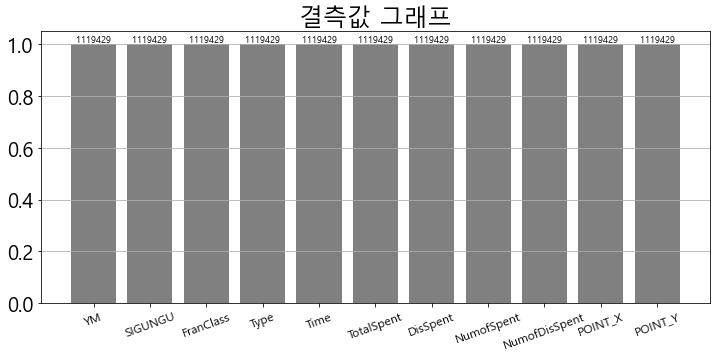

In [6]:
plt.figure(figsize=(12,5))
plt.grid(True, axis='y')
plt.bar(cols, y_ratio_list, color='gray')

for i, v in enumerate(cols):
    plt.text(v, y_ratio_list[i], y_len_list[i],
             fontsize = 9, 
             color='black',
             horizontalalignment='center',
             verticalalignment='bottom') 


plt.title('결측값 그래프')
plt.xticks(fontsize =12, rotation=20)
plt.show()

## 1-3. 데이터 정제
### 1-3-1. 정의에 부합하지 않은 데이터 삭제

* 삭제 대상 : 총 이용건수, 재난지원금 이용건수, 총 사용금액, 재난지원금 사용금액
  1. 총 이용건수보다 재난지원금 이용건수가 큰 경우 
    * 전체 이용건수보다 재난지원금 이용건수가 클 수는 없으므로 삭제합니다.
  2. 총 이용건수가 0임에도 총 사용금액이나 재난지원금 사용금액이 0이 아닌 경우 
    * 이용건수가 없음에도 돈이 사용되었다는 것이므로 삭제합니다.
  3. 재난지원금 이용건수가 0임에도 재난지원금 사용금액이 0이 아닌 경우
    * 재난지원금 이용건수가 0이면 사용이든 환불이든 없었다는 것이므로 삭제합니다.
  3. 총 이용건수와 재난지원금 이용건수가 같으나 총 소비액과 재난지원금 소비액이 다른 경우 
    * 재난지원금으로만 소비했다는 것이므로 다른 소비는 0일 것입니다. 그러므로 이 경우도 삭제합니다.

In [7]:
drop_inds = []

# 1. 재난지원금 이용횟수가 총 이용횟수보다 더 많은 경우
drop_inds+=df[df['NumofDisSpent']>df['NumofSpent']].index.tolist()

# 2. 총 이용건수가 0임에도 총 사용금액이나 재난지원금 사용금액이 0이 아닌 경우
drop_inds+=df[(df['NumofSpent']==0)&((df['TotalSpent']!=0) | (df['DisSpent']!=0) )].index.tolist()

# 3. 재난 이용건수가 0임에도 재난지원금 사용금액이 0이 아닌 경우
drop_inds +=df[(df['NumofDisSpent']==0)&(df['DisSpent']!=0)].index.tolist()

# 4. 총 이용건수와 재난지원금 이용건수가 같으나 총 소비액과 재난지원금 소비액이 다른 경우
drop_inds += df[(df['NumofDisSpent']==df['NumofSpent']) & (df['TotalSpent']!=df['DisSpent'])].index.tolist()

In [8]:
# 정제 대상
drop_inds = np.unique(drop_inds).tolist()
print('삭제될 row 개수 : %s'%len(drop_inds))

삭제될 row 개수 : 1513


In [9]:
df = df.drop(drop_inds,axis=0).reset_index(drop=True)

정제 후 row 개수

In [10]:
df.shape[0]

1113377

### 1-3-2. 상점 단위로 비교하기 위해 가게 key값을 따로 만들기
* SIGUNGU, FranClass, Type, POINT_X, POINT_Y를 key값으로 사용하면 월, 시간별로 key값 데이터의 중복이 없어 이를 가게단위로 가정하고 사용했습니다.
* 해당 key값은 keys라는 변수로 저장합니다.

In [11]:
keys = ['SIGUNGU','FranClass','Type','POINT_X','POINT_Y']
unique_months = [202005,202006,202007,202008]

여기서 ValueError가 뜨지 않으면 중복되는 경우가 없다는 것임

In [12]:
for ym in np.unique(df['YM']):
    t_df = df[df['YM']==ym].reset_index(drop=True)
    for time in np.unique(df['Time']):
        tt_df = t_df[t_df['Time']==time].reset_index(drop=True)
        tt_df = tt_df[['SIGUNGU','FranClass','Type','POINT_X','POINT_Y']]
        n = len(tt_df)
        ttt_df = tt_df.drop_duplicates()
        m = len(ttt_df)
        if n != m:
            raise ValueError

Key값으로 합치기 : s_num으로 key값 지정

In [13]:
shop_df = df.loc[:,keys].drop_duplicates().reset_index(drop=True)
shop_df['s_num'] = [i for i in range(len(shop_df))]

df = pd.merge(df, shop_df, on=keys, how='left')

### 1-3-3. 새로운 column 생성
분석에 도움이 되는 파생변수를 만듭니다.
* YM_Time (str) : 월과 시간을 합친 데이터
* NotDisSpent : 총 사용금액에서 재난지원금을 제외한 사용금액. <span style='color:red'>일반 사용금액</span>이라고 정의합니다.
* NotDisNumofSpent : 총 이용횟수에서 재난지원금 이용횟수를 제외한 이용횟수.  <span style='color:red'>일반 이용횟수</span>라고 정의합니다.

In [14]:
df['YM_Time'] = df['YM'].apply(lambda x: str(x)[5:]+'월')+df['Time']
df['NotDisSpent'] = df['TotalSpent'] - df['DisSpent']
df['NumofNotDisSpent'] = df['NumofSpent'] - df['NumofDisSpent']

## 1-4. 지도 데이터 준비
* 좌표 데이터를 활용하여 지도와 좌표를 시각화하기 위해 데이터를 정제합니다.
* 아래 LSMD_ADM_SECT_UMD_50_202012.shp 파일은 아래 홈페이지에서 다운 받으실 수 있습니다.
  * http://data.nsdi.go.kr/dataset/15145
* 이 과정에서 정제한 df에 'EMD_NM'이라는 column이 추가 됩니다. 이는 해당 상점의 주소(읍면동 단위)를 말합니다.
* coor_df가 추가됩니다. 읍면동 코드 값과 해당하는 읍면동의 Polygon 객체를 가지고 있습니다.


각 상점에 매칭되는 읍면리 이름을 넣는과정

In [15]:
def set_map():
    """
    shp파일을 geopandas로 불러온 뒤 좌표계를 EPSG:5179로 바꿈. 현재 df의 Point 좌표계가 5179이기 때문에 읍면리 좌표를
    5179 좌표계로 변경해서 매칭시킵니다.
    * 참고로 EPSG:5179일 때 두 Point A,B의 x,y 좌표의 유클리디안 거리값이 A,B의 거리값이 됩니다.(1km 떨어져있다 등)
    """
    
    file = gpd.read_file('LSMD_ADM_SECT_UMD/LSMD_ADM_SECT_UMD_50_202012.shp', encoding='euckr')
    file.crs = 'Proj4: +proj=tmerc +lat_0=38 +lon_0=127.0028902777778 +k=1 +x_0=200000 +y_0=500000 +ellps=bessel +units=m +no_defs +towgs84=-115.80,474.99,674.11,1.16,-2.31,-1.63,6.43'
    file = file.to_crs('EPSG:5179')
    return file

In [16]:
# 지도 파일 불러오기
file = set_map()


coor_df = df.groupby(['POINT_X','POINT_Y']).size().reset_index()
coor_df['coor_num'] = coor_df.index.tolist()

# point_dict : 각 상점(Point)이 속한 읍면리 정보를 가진 데이터
    # 파일이 이미 존재할 경우 생성과정 생략
if os.path.isfile('point_dict.pkl'):
    with open('point_dict.pkl', 'rb') as f:
        point_dict = pickle.load(f)

else:
    point_dict = {}
    for i in range(len(coor_df)):
        point = Point(coor_df.loc[i,['POINT_X','POINT_Y']])
        sw = False
        min_v = 9999999999
        min_i = 0

        if i not in point_dict.keys():
            point_dict[i] = {}
            point_dict[i]['point'] = point
            point_dict[i]['polygon'] = []
            point_dict[i]['EMD_CD'] = []

        for j in range(len(file)):
            polygon = file.loc[j,'geometry']

            if polygon.distance(point) < min_v:
                min_j = j
                min_v = polygon.distance(point)

            if polygon.intersects(point):
                point_dict[i]['polygon'].append(j)
                point_dict[i]['EMD_CD'].append(file.loc[j,'EMD_CD'])
                sw = True
                break
        
        # 만약 어떤 읍면에도 속하지 않는 경우 : point 위치가 애매하여 
        # 읍면리 Polygon에 포함되지 않는다고 나왔으므로 가장 거리가 가까운 읍면에 속하게 만듦
        if sw ==False:

            point_dict[i]['polygon'].append(min_j)
            point_dict[i]['EMD_CD'].append(file.loc[min_j,'EMD_CD'])

    
    with open('point_dict.pkl', 'wb') as fp:
        pickle.dump(point_dict, fp)

# 각 상점 Point에 읍면리 할당한 list 생성
point_keys = [key for key in point_dict.keys()]
emd_list = []
for key in point_dict.keys():
    emd_list.append(point_dict[key]['EMD_CD'][0])

In [17]:
# 각 Point에 읍면리 이름, 읍면리 번호 넣음
emd_df = pd.DataFrame({'coor_num':point_keys, 'EMD_CD':emd_list})
coor_df = pd.merge(coor_df, emd_df, on='coor_num', how='left')
coor_df = pd.merge(coor_df, file[['EMD_CD','EMD_NM']], on='EMD_CD', how='left')

# df에 읍면리 이름을 넣음
if 'EMD_NM' not in df.columns:
    df = pd.merge(df, coor_df[['POINT_X','POINT_Y','EMD_NM']], how='left', on=['POINT_X','POINT_Y'])


상점(Point) 데이터를 EPSG:4326으로 바꾸는 과정 : plotly 패키지에서 지도로 시각화 할 때 사용되는 좌표계인 4326으로 바꿉니다.

In [18]:
# 읍면리 데이터에 대해 geopandas에서 좌표계를 4326으로 명명합니다.
file2 = file.to_crs('EPSG:4326')

# geojson으로 저장합니다. 이는 plotly에서 지도로 시각화 할 때 사용합니다.
# 직접 만들 수도 있지만 json으로 저장한 뒤 사용하는 것이 더 편리합니다.
if not os.path.isfile('maps.geojson'):
    file2.to_file('maps.geojson', driver='GeoJSON')

# 저장했던 json 파일을 불러옵니다.
with open('maps.geojson') as f:
    file3 = json.load(f)

# json의 id값을 새로 생성합니다. 그래야 TotalSpent 등을 가진 dataframe과 지도 json 파일을 매칭시킬 수 있습니다.
for i in range(len(file3['features'])):
    id_ = file3['features'][i]['properties']['EMD_NM']
    file3['features'][i]['id'] = id_

# 각 Point를 EPSG 4326으로 바꾸기 위한 작업입니다.
points = []
for i in range(len(coor_df)):
    x = coor_df.loc[i,'POINT_X']
    y = coor_df.loc[i,'POINT_Y']
    points.append(Point(x,y))

geo_coor_df = gpd.GeoDataFrame({'geometry':points}, crs='EPSG:5179')
geo_coor_df = geo_coor_df.to_crs('EPSG:4326')

# 변환한 결과를 coor_df에 저장합니다.
x_list = []
y_list = []
for i in range(len(geo_coor_df)):
    obj = geo_coor_df.loc[i,'geometry']
    x = obj.x
    y = obj.y
    x_list.append(x)
    y_list.append(y)
    
coor_df['POINT_X2'] = x_list
coor_df['POINT_Y2'] = y_list

#### 분석에 사용할 데이터프레임

In [19]:
df.head()

,YM,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,s_num,YM_Time,NotDisSpent,NumofNotDisSpent,EMD_NM
0,202005,제주시,영세,일반한식,00시,363000,66500,10,2,877005.9834,1.479766e+06,0,5월00시,296500,8,한경면
1,202005,제주시,영세,단란주점,00시,1180000,0,3,0,877005.7447,1.479816e+06,1,5월00시,1180000,3,한경면
2,202005,제주시,중소1,편의점,00시,157670,6850,20,2,877056.6756,1.479616e+06,2,5월00시,150820,18,한경면
3,202005,제주시,영세,편의점,00시,46600,0,2,0,877055.9593,1.479766e+06,3,5월00시,46600,2,한경면
4,202005,제주시,영세,주점,00시,66000,0,2,0,877055.4817,1.479866e+06,4,5월00시,66000,2,한경면


In [20]:
# 생성된 읍면리, POINT dataframe
coor_df.head()

,POINT_X,POINT_Y,0,coor_num,EMD_CD,EMD_NM,POINT_X2,POINT_Y2
0,875603.5564,1.480409e+06,34,0,50110310,한경면,126.163745,33.307952
1,875610.4808,1.478960e+06,41,1,50110310,한경면,126.164019,33.294884
2,875638.9593,1.483458e+06,38,2,50110310,한경면,126.163706,33.335449
3,875653.0546,1.480509e+06,38,3,50110310,한경면,126.164263,33.308862
4,875653.2934,1.480459e+06,110,4,50110310,한경면,126.164272,33.308411


# 2. 데이터 분석

### 함수정의 파트
사용하는 함수를 여기서 정의합니다

In [21]:
def make_pie_bar_graph_type1(df_, ratio_dis, ratio_notdis, x, pie_title='',
                      bar_title='',  y_label='금액(원)'):
    """
    전체 기간, 월간 원 그래프와 막대 그래프를 생성합니다.
    
    Parameters
    ____________________
    
    df_ : pandas.core.frame.DataFrame
    input 데이터프레임입니다.(현재 코드에서 df를 쓴다고 생각하시면 됩니다)
    
    ratio_dis : like array
    원그래프에서 재난지원금 사용금액 비율입니다.
    
    ratio_notdis : like array
    원그래프에서 일반 사용금액 비율입니다.
    
    x : like array
    원 그래프 각 y값의 이름입니다.
    
    pie_title : str
    원 그래프에 사용할 제목입니다.
    
    bar_title : str
    막대 그래프에 사용할 제목입니다.
    
    y_label : like array
    막대 그래프에서 y축에 사용할 label 이름입니다.
    
    
    Returns
    ______
    
    그래프를 생성합니다.
    """
    
    fig, axs = plt.subplots(1, 2, figsize=(24, 7))

    wedges, texts, autotexts = axs[0].pie([ratio_notdis, ratio_dis], autopct='%.1f%%',
                                      textprops=dict(color="w"),
                                         shadow=True)
    axs[0].legend(wedges, x,
              loc="upper right",
              bbox_to_anchor=(1, 0, 0.5, 1))
    
    totals = []
    dises = []
    ratios = []
    not_ratios = []
    for month in [202005,202006,202007,202008]:
        temp_df = df_[df_['YM']==month].reset_index(drop=True)
        total = sum(temp_df['TotalSpent'])
        dis = sum(temp_df['DisSpent'])
        totals.append(total)
        dises.append(dis)
        ratios.append('%.1f%%'%((dis/total)*100))
        not_ratios.append('%.1f%%'%((1-(dis/total))*100))
    temp_x = [str('%s월'%i) for i in range(5,9)]
    axs[1].bar(temp_x, totals, width=0.4, label='일반')
    axs[1].bar(temp_x, dises, width=0.4, label='재난지원금')

    rects = axs[1].patches

    for i, (rect, value, not_value) in enumerate(zip(rects, ratios, not_ratios)):
        height = rect.get_height()
        axs[1].text(s=value, x=i, y=2,
                 ha='center', va='bottom', fontsize=15)
        axs[1].text(s=not_value, x=i, y=height/2,
                 ha='center', va='bottom', fontsize=15)

    axs[1].grid(True, axis='y')
    axs[1].legend()
    axs[0].set_title(pie_title)
    axs[1].set_title(bar_title)
    axs[1].set_xlabel('월')
    axs[1].set_ylabel(y_label)
    plt.show()
    

In [22]:
def make_button_dict(label, visible_list, title, method='update'):
    """
    plotly 그래프에서 버튼 dict를 생성합니다.
    
    Parameters
    ____________________
    
    label : str
    버튼에 들어갈 text입니다.
    
    visible_list : like array
    이 버튼을 눌렀을 때 visible 할 객체를 지정합니다.
    ex) [True, False, False, False] : 첫번째 객체만 visible 합니다.
    
    title : str
    해당 버튼의 그래프 제목에 들어갈 text입니다.
    
    method : str
    버튼 형식입니다. update, restyle 등이 있습니다.
    
    
    Returns
    ____________________
    
    button_dict : dict
    지정한 속성이 저장된 button dict를 반환합니다.
    """
    if title != '': 
        button_dict = dict(label = label,
                           method = method,
                           args = [{'visible': visible_list},
                                   {'title': {'text':title,
                                              'y':0.9,'x':0.5,'xanchor':'center','yanchor': 'top'},
                                    'showlegend':True}])
    else:
        button_dict = dict(label = label,
                           method = method,
                           args = [{'visible': visible_list},
                                   {'title': {'text':title,
                                              'y':0.9,'x':0.5,'xanchor':'center','yanchor': 'top'},
                                    'showlegend':True}])
        
    return button_dict


def fig_add_trace(fig, x,y,name, visible=False, graph_type='bar'):
    """
    fig에 그래프를 추가합니다.
    
    Parameters
    ____________________
    
    fig : plotly.graph_objs._figure.Figure
    go.Figure() 객체입니다.
    
    x : like array
    막대 그래프의 x 부분입니다.
    
    y : like array
    막대 그래프의 y 부분입니다.
    
    name : str
    막대 그래프에 들어갈 이름을 넣습니다.
    
    visible : boolean
    그래프를 초기에 나타낼지 여부를 결정합니다. True면 함수 실행시 초기에 해당 그래프를 표시합니다.
    
    graph_type : str
    추가할 그래프 타입입니다. 막대 그래프를 만든다면 'bar'를 파라미터로 넣습니다.
    
    
    Returns
    ____________________
    
    fig : plotly.graph_objs._figure.Figure
    지정한 속성이 추가된 fig 객체를 반환합니다.
    """
    
    if graph_type == 'bar':
        fig.add_trace(
                go.Bar(
                    x=x, 
                    y=y,
                    name = name,
                    visible = visible
                )
            )
    return fig


def make_five_bars_sum_groups(df_,target_col, col, num):
    """
    target_col에 해당하는 상점의 전체, 5월, 6월, 7월, 8월을 각각 group sum한 col의 막대 그래프를 go.Figure() 객체에 만듭니다.
    ex) 업종별 전체 5,6,7,8월 총 사용금액에 대한 그래프
    
    Parameters
    ____________________
    
    df_ : pandas.core.frame.DataFrame
    데이터 추출을 위한 dataframe 입니다.
    
    target_col : str
    막대 그래프에서 추출 기준이 되는 column입니다.
    
    col : str
    막대 그래프에서 group sum한 결과값으로 쓸 column입니다.
    
    num : int
    표현하고자 하는 target_col의 종류 개수입니다.
    
    Returns
    ____________________
    
    fig : plotly.graph_objs._figure.Figure
    지정한 속성이 추가된 fig 객체를 반환합니다.
    """
    
    
    temp_df = df_.groupby(['YM',target_col]).sum().reset_index()
    all_temp_df = df_.groupby(target_col).sum().reset_index()
    all_temp_df = all_temp_df.sort_values(col, ascending=False).reset_index(drop=True)
    if num !=0:
        all_temp_df = all_temp_df.loc[:num-1,:]

    key_cols = np.unique(df['YM'])


    fig = go.Figure()
    x = all_temp_df[target_col]
    y = all_temp_df[col]
    fig = fig_add_trace(fig, x,y, name='전체', visible=True)
    
    sw_v = False
    for i,key_col in enumerate(key_cols):

        t_temp_df = temp_df[temp_df['YM']==key_col]
        t_temp_df = t_temp_df.sort_values(col,ascending=False).reset_index(drop=True)
        if num !=0:
            t_temp_df = t_temp_df.loc[:num-1,:]
        x = t_temp_df[target_col]
        y = t_temp_df[col]
        name = '%s월'%(str(key_col)[5])
        fig = fig_add_trace(fig, x,y, name=name, visible=False)

    return fig


def make_five_bars_size_groups(df_,target_col, num,keys):
    """
    target_col에 해당하는 상점의 전체, 5월, 6월, 7월, 8월 개수에 대한 막대 그래프를 go.Figure() 객체에 만듭니다.
    ex) 업종별 전체 5,6,7,8월 총 사용금액에 대한 그래프
    
    Parameters
    ____________________
    
    df_ : pandas.core.frame.DataFrame
    데이터 추출을 위한 dataframe 입니다.
    
    target_col : str
    막대 그래프에서 추출 기준이 되는 column입니다.
    
    num : int
    표현하고자 하는 target_col의 종류 개수입니다.
    
    keys : like array
    row를 1개 상점 단위로 만들기 위해 쓰는 key값 column list입니다.
    
    Returns
    ____________________
    
    fig : plotly.graph_objs._figure.Figure
    지정한 속성이 추가된 fig 객체를 반환합니다.
    """
    
    col = 'Size'
    all_temp_df = df_.groupby(keys).sum().reset_index()
    all_temp_df = all_temp_df.groupby(target_col).size().to_frame(col).reset_index()
    all_temp_df = all_temp_df.sort_values(col, ascending=False).reset_index(drop=True)
    
    if num !=0:
        all_temp_df = all_temp_df.loc[:num-1,:]
    key_cols = np.unique(df['YM'])


    fig = go.Figure()
    x=all_temp_df[target_col]
    y=all_temp_df[col]
    fig = fig_add_trace(fig, x,y, name='전체', visible=True)

    sw_v = False
    for i,key_col in enumerate(key_cols):
        
        t_temp_df = df_[df_['YM']==key_col]
        t_temp_df = t_temp_df.groupby(keys).sum().reset_index()
        t_temp_df = t_temp_df.groupby(target_col).size().to_frame(col).reset_index()
        t_temp_df = t_temp_df.sort_values(col,ascending=False).reset_index(drop=True)
        if num !=0:
            t_temp_df = t_temp_df.loc[:num-1,:]
        
        x = t_temp_df[target_col]
        y = t_temp_df[col]
        name = '%s월'%(str(key_col)[5])
        fig = fig_add_trace(fig, x,y, name=name, visible=False)
        
    return fig


def make_five_bars_mean_groups(df_,target_col, col,num,keys):
    """
    target_col에 해당하는 상점의 전체, 5월, 6월, 7월, 8월을 각각 group mean한 col의 막대 그래프를 go.Figure() 객체에 만듭니다.
    ex) 업종별 전체 5,6,7,8월 총 사용금액에 대한 그래프
    
    Parameters
    ____________________
    
    df_ : pandas.core.frame.DataFrame
    데이터 추출을 위한 dataframe 입니다.
    
    target_col : str
    막대 그래프에서 추출 기준이 되는 column입니다.
    
    col : str
    막대 그래프에서 group sum한 결과값으로 쓸 column입니다.
    
    num : int
    표현하고자 하는 target_col의 종류 개수입니다.
    
    keys : like array
    row를 1개 상점 단위로 만들기 위해 쓰는 key값 column list입니다.
    
    Returns
    ____________________
    
    fig : plotly.graph_objs._figure.Figure
    지정한 속성이 추가된 fig 객체를 반환합니다.
    """
    
    
    all_temp_df = df_.groupby(keys).sum().reset_index()
    all_temp_df = all_temp_df.groupby(target_col).mean().reset_index()
    all_temp_df = all_temp_df.sort_values(col, ascending=False).reset_index(drop=True)
    
    if num !=0:
        all_temp_df = all_temp_df.loc[:num-1,:]
    key_cols = np.unique(df['YM'])

    
    fig = go.Figure()
    x = all_temp_df[target_col]
    y = all_temp_df[col]
    fig = fig_add_trace(fig, x,y, name='전체', visible=True)

    sw_v = False
    for i,key_col in enumerate(key_cols):

        
        t_temp_df = df_[df_['YM']==key_col]
        t_temp_df = t_temp_df.groupby(keys).sum().reset_index()
        t_temp_df = t_temp_df.groupby(target_col).mean().reset_index()
        t_temp_df = t_temp_df.sort_values(col,ascending=False).reset_index(drop=True)
        
        if num !=0:
            t_temp_df = t_temp_df.loc[:num-1,:]
        
        x=t_temp_df[target_col]
        y=t_temp_df[col]
        name = '%s월'%(str(key_col)[5])
        fig = fig_add_trace(fig, x,y, name=name, visible=False)

        
    return fig



def make_five_bars(df_,target_col, y_col, name, num=20, group_option='sum', keys=''):
    """
    target_col에 해당하는 상점의 전체, 5월, 6월, 7월, 8월을 각각 group 한 col의 막대 그래프를 go.Figure() 객체에 만듭니다.
    ex) 업종별 전체 5,6,7,8월 총 사용금액에 대한 그래프
    
    Parameters
    ____________________
    
    df_ : pandas.core.frame.DataFrame
    데이터 추출을 위한 dataframe 입니다.
    
    target_col : str
    막대 그래프에서 추출 기준이 되는 column입니다.
    
    y_col : str
    막대 그래프에서 group sum한 결과값으로 쓸 column입니다.
    
    name : str
    그래프 제목입니다.
    
    num : int
    표현하고자 하는 target_col의 종류 개수입니다.
    
    group_option : str
    group 옵션입니다. 'sum', 'mean', 'size' 중 1개를 쓰면 됩니다.
    
    keys : like array
    row를 1개 상점 단위로 만들기 위해 쓰는 key값 column list입니다.
    
    Returns
    ____________________
    
    그래프를 생성합니다.
    """
    
    switch_list = [False,False,False,False,False]
    month_labels = ['전체','5월','6월','7월','8월']
    
    if group_option == 'sum':
        fig = make_five_bars_sum_groups(df_,target_col, y_col, num)
    elif group_option == 'size':
        fig = make_five_bars_size_groups(df_,target_col, num, keys)
    elif group_option == 'mean':
        fig = make_five_bars_mean_groups(df_,target_col, y_col,num,keys)
    
    button_list = []
    for i in range(len(switch_list)):
        t_switch_list = switch_list[:]
        t_switch_list[i] = True
        label = month_labels[i]
        button_obj = make_button_dict(label, t_switch_list, '전체 업종별 %s(상위 %s개)'%(name,num))
        button_list.append(button_obj)

    fig.update_layout(
        width=700,
        autosize=False,
        height=400,
        updatemenus=[go.layout.Updatemenu(
            active=0,
            buttons=button_list
            )
        ])
    fig.update_yaxes(automargin=True)
    fig.show()

In [23]:
def plot_pie_graph(x,y, title, ax_, fontsize=8, ratio_option=True):
    """
    지정한 원 그래프를 그립니다.
    
    Parameters
    ____________________
    
    x : like array
    원 그래프의 label 값입니다.
    
    y : like array
    원 그래프의 크기 부분인 y값입니다.
    
    title : str
    원 그래프의 title입니다.
    
    ax_ : matplotlib.axes._subplots.AxesSubplot
    그래프를 넣고자 하는 ax입니다.
    
    fontsize : int
    원 그래프의 글자 크기입니다.
    
    ratio_option : boolean
    y값을 비율로 표현할지 정합니다.
    
    Returns
    ____________________
    
    ax_ : 원 그래프를 추가한 ax를 반환합니다.
    
    """
    explode = [0.05 for i in range(len(x))]
    if raatio_option == True:
        ax_.pie(y, labels=x, autopct='%.1f%%', startangle=260, counterclock=False, explode=explode, shadow=True,
                textprops={'fontsize': fontsize,
                          'color':'w'})
    else:
        ax_.pie(y, labels=x, startangle=260, counterclock=False, explode=explode, shadow=True,
                textprops={'fontsize': fontsize,
                          'color':'w'})
        
    ax_.set_title(title)
    return ax_
    
def plot_bar_graph(x,y, title, ax_, fontsize=8):
    """
    지정한 막대 그래프를 그립니다.
    
    Parameters
    ____________________
    
    x : like array
    막대 그래프의 label 값입니다.
    
    y : like array
    막대 그래프의 크기 부분인 y값입니다.
    
    title : str
    원 그래프의 title입니다.
    
    ax_ : matplotlib.axes._subplots.AxesSubplot
    그래프를 넣고자 하는 ax입니다.
    
    fontsize : int
    원 그래프의 글자 크기입니다.
    
    Returns
    ____________________
    
    ax_ : matplotlib.axes._subplots.AxesSubplot
    원 그래프를 추가한 ax를 반환합니다.
    
    """

    ax_.bar(x, y)
    ax_.set_title(title)
    rects = ax_.patches

    for rect, value in zip(rects, y):
        height = rect.get_height()
        ax_.text(rect.get_x() + rect.get_width() / 2, height + 5, value,
                 ha='center', va='bottom', fontsize=fontsize)
    
    ax_.grid(True, axis='y')
    
    ax_.set_xticklabels(x, rotation =30, fontsize=fontsize)
    return ax_


## 2-1. 지역중분류 분석 (제주도시 vs 서귀포시)
제주도시와 서귀포시 비교를 중심으로 분석합니다.

### 요약 
* 제주도시가 상점 개수, 총 사용금액 등의 규모는 2배 이상 더 크며 각 상점의 업종, 소상공인 비율은 유사합니다.  
* 서귀포시, 제주도시의 가장 많은 업종 5개 중 4개는 같은 것으로 전체적으로 서로 비슷한 성격의 업종을 가지고 있습니다.

### 상점 개수
* 제주도시가 서귀포시보다 2배 이상 상점을 가지고 있습니다.
* 사용금액의 경우도 재난지원금 등 3개 모두 상점 개수와 비례하여 제주도시가 서귀포시보다 2배 이상 높습니다

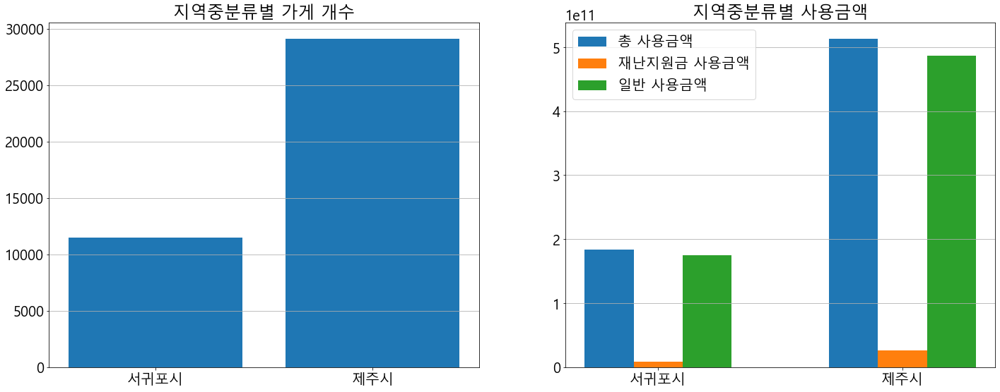

In [24]:
temp_df = df.groupby(keys).sum().reset_index()
size_temp_df = temp_df.groupby('SIGUNGU').size().to_frame('Size').reset_index()
sum_temp_df = temp_df.groupby('SIGUNGU').sum().reset_index()
x=np.array([1,2])

fig, axs = plt.subplots(1, 2, figsize=(24,9))
axs[0].bar(size_temp_df['SIGUNGU'], size_temp_df['Size'])
axs[0].set_title('지역중분류별 가게 개수')

axs[1].bar(x-0.2, sum_temp_df['TotalSpent'], width=.2, label='총 사용금액')
axs[1].bar(x, sum_temp_df['DisSpent'], width=.2, label='재난지원금 사용금액')
axs[1].bar(x+0.2, sum_temp_df['NotDisSpent'], width=.2, label='일반 사용금액')
axs[1].set_xticks(x)
axs[1].set_xticklabels(sum_temp_df['SIGUNGU'])
axs[1].set_title('지역중분류별 사용금액')
axs[1].legend()

axs[0].grid(True, axis='y')
axs[1].grid(True, axis='y')

plt.show()


지도로 나타내면 다음과 같습니다. 
* 원은 각 상점입니다.
* 그래프에서 원의 크기는 총 사용금액의 크기입니다.
* 아래에서 그래프를 보시면 제주시가 제주도의 북쪽부분인데 서귀포시에 비해 훨신 많은 상점을 가지고 있고 총 사용금액 또한 더 높다고 추정할 수 있습니다.
* 제주도시에서 가운데 북쪽에 상점이 몰려있는데 이는 공항 때문에 인근이 발달한 것으로 추정됩니다.

In [25]:
temp_df = df.groupby(['SIGUNGU','POINT_X', 'POINT_Y']).sum().reset_index()
temp_df = pd.merge(temp_df, coor_df, on=['POINT_X','POINT_Y'], how='left')

fig2 = px.scatter_mapbox(temp_df, lat="POINT_Y2", lon="POINT_X2", color="SIGUNGU",
                         mapbox_style="carto-positron",
                  color_continuous_scale="magma", size_max=40, zoom=10,opacity=0.4, size="TotalSpent")

#fig.show()
fig2.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig2.show()

### 지역중분류별 업종 분포
* 업종 개수가 100개를 넘어 모두 표현할 수 없어 상위 20개만 원그래프에 표현했습니다.
* 앞으로 보실 업종 관련 원그래프에서 다른 업종은 상위 20개 이외의 나머지 업종을 의미합니다.
* 위에서 구했던 상점별 key값을 기준으로 상점 단위로 dataframe을 바꾼 뒤 지역중분류별 업종 분포를 구합니다.
  * row가 상점 1개가 됩니다.
* 해석은 다음과 같습니다.
  * 서귀포시, 제주도시의 가장 많은 업종 5개 중 4개는 같은 것으로 전체적으로 서로 비슷한 성격의 업종을 가지고 있습니다.
    (일반한식, 서양음식, 기타숙박업, 편의점)
  * 제주도시는 상위 5개 업종이 약 45%를 차지하는 반면, 약 36%를 차지합니다.

In [26]:
target_col = 'SIGUNGU'
temp_df = df.groupby(keys).sum().reset_index()
key_cols = np.unique(df[target_col])
num = 20

fig = go.Figure()

for i,key_col in enumerate(key_cols):
    if i != 0:
        v_sw = False
    else:
        v_sw = True

    t_temp_df = temp_df[temp_df[target_col]==key_col].reset_index(drop=True)
    t_temp_df = t_temp_df.groupby('Type').size().to_frame('Size').reset_index()
    t_temp_df = t_temp_df.sort_values('Size', ascending=False).reset_index(drop=True)
    sums = sum(t_temp_df.loc[num:,'Size'])
    t_temp_df = t_temp_df.loc[:num-1,:]
    t_temp_df.loc[num,:] = ['다른 업종',sums]
    fig.add_trace(
        go.Pie(
            labels=t_temp_df.Type, 
            values=t_temp_df.Size,
            name = key_col,
            visible = v_sw
        )
    )

jeju_botton_dict = make_button_dict('제주도시', [True, False], '제주도시 업종 비중')
seo_botton_dict = make_button_dict('서귀포시', [False,True], '서귀포시 업종 비중')

fig.update_layout(

    updatemenus=[go.layout.Updatemenu(
        active=0,
        
        buttons=list(
            [jeju_botton_dict,
             seo_botton_dict,
            ])
        )
    ])

fig.show()


### 소상공인 분포
* 위에서 구했던 상점별 key값을 기준으로 상점 단위로 dataframe을 바꾼 뒤 소상공인 분포를 구합니다.
  * row가 상점 1개가 됩니다.
* 두 도시 모두 영세 > 일반 > 중소 > 중소1 > 중소2 순의 상점 비율을 가지고 있습니다.
* 제주도시의 경우 서귀포시에 비해 영세와 일반이 더 높은 비율을 차지하는 반면 중소는 서귀포시가 더 높습니다.

In [27]:
target_col = 'SIGUNGU'
x_col = 'FranClass'
temp_df = df.groupby(keys).sum().reset_index()
key_cols = np.unique(df[target_col])
num = 20

fig = go.Figure()

for i,key_col in enumerate(key_cols):
    if i != 0:
        v_sw = False
    else:
        v_sw = True
    t_temp_df = temp_df[temp_df[target_col]==key_col].reset_index(drop=True)
    t_temp_df = t_temp_df.groupby(x_col).size().to_frame('Size').reset_index()
    t_temp_df = t_temp_df.sort_values('Size', ascending=False).reset_index(drop=True)

    fig.add_trace(
        go.Pie(
            labels=t_temp_df[x_col], 
            values=t_temp_df.Size,
            name = key_col,
            visible= v_sw
        )
    )

jeju_button_dict = make_button_dict('제주도시', [True, False], '제주도시 소상공인 비중')
seo_button_dict = make_button_dict('서귀포시', [False,True], '서귀포시 소상공인 비중')

fig.update_layout(

    updatemenus=[go.layout.Updatemenu(
        active=0,
        buttons=list(
            [jeju_button_dict,
             seo_button_dict,
            ])
        )
    ])

fig.show()

## 2-2. 사용금액
총 사용금액, 재난지원금 사용금액, 일반 사용금액에 대한 데이터 분석을 실시합니다.

### 요약 
* 6월을 제외하면 제주도에서 소비가 증가하는 것을 볼 수 있습니다.
* 재난지원금은 시간이 지날수록 사용량이 감소합니다.
* 제주도 상점의 업종분포를 보면 일반한식, 서양음식, 기타숙박업, 편의점, 농축수산물이 가장 많으며 일반한식이 다른 업종보다 2배이상 많습니다. 특히 식당과 숙박업이 발달한 점은 관광지라는 특성을 말합니다.
* 업종별 사용금액을 분석했을 때
  * 재난지원금 : 생필품 등 생활에 밀접한 용도로 더 사용된 것을 알 수 있습니다.
  * 일반 사용금액에서 면세점이 상위에 있고 점점 사용금액이 증가하는 것으로 보아 관광소비가 증가한다고 추정할 수 있습니다.
* 일반한식 분석
  * 전체 사용금액과 상점의 소상공인 분포는 전체 업종과 유사한 패턴을 보입니다.(1-4 파트 참조)
  * 소상공인별 사용금액 비교에서는 영세가 제일 높게 나왔으나 상점 1개 당 평균 사용금액에서는 영세가 제일 낮게 나왔습니다. 이는 영세가 가게 개수가 제일 많지만 사용금액은 서로 간 차이가 크다는 것으로 추정할 수 있습니다.
    * 반면 중소2의 경우 상점 간 차이가 제일 적게 나왔는데 이는 중소2의 일반한식 상점 간 사용금액의 차이가 다른 것에 비해 작다는 것을 말합니다.
* 일반 한식 상점 위치별 사용금액 분석 결과, 관광지 부근에서 사용금액이 제일 높은 것을 볼 수 있습니다.

### 2-2-1. 전체 사용금액 분석
* dataframe 전체, 월별 사용금액에 대해 분석합니다.
* 전체 기간동안 총 사용금액은 약 6968억 원이며 재난지원금은 약 353억 원입니다.
* 전체 기간동안 사용금액의 경우 재난지원금은 전체의 5%정도 차지합니다.
* 월별로 보면 재난지원금이 점점 떨어지는 것을 볼 수 있는데 이는 과거에 받은 재난지원금이 소모되가는 과정을 보여주고 있습니다.
* 6월에 총 사용금액이 약간 감소했는데 이는 여행객이 6월에 감소한 것이 요인인 것으로 추정됩니다.  
  (참고 : https://www.headlinejeju.co.kr/news/articleView.html?idxno=422095)
* 나머지 달에서는 계속 상승하고 있어 제주도 경제가 조금씩 활성화 되는 것을 볼 수 있습니다.
  (물론 7~8월이 휴가 시즌인 점도 있으나, 어쨌든 코로나 시국임에도 불구하고 소비가 확장되는 것을 근거로 말한 것입니다)

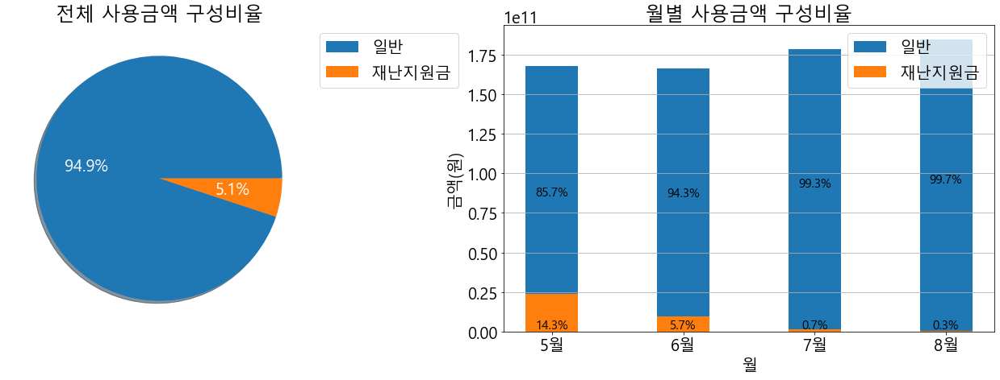

In [28]:
total = sum(df['TotalSpent'])
dis = sum(df['DisSpent'])/ total
notdis = sum(df['NotDisSpent'])/ total
x = ['일반','재난지원금']
make_pie_bar_graph_type1(df, dis, notdis, x,'전체 사용금액 구성비율', '월별 사용금액 구성비율' )

#### 읍면리별 사용금액 시각화
각 읍면리에 대해 총 사용금액, 재난지원금 사용금액, 일반 사용금액을 시각화를 실시했습니다.
* 전체적으로 북쪽 가운데 부근 (노형동, 연동)에서 사용금액, 이용횟수가 높았습니다.
* 일반 사용금액의 경우 노형동, 연동, 용담이동 등에서 숫자가 컸으나 재난지원금의 경우 용담이동은 외려 낮게 나왔습니다.

In [29]:
temp_df = df.groupby('EMD_NM').sum().reset_index()

In [30]:
cols = ['TotalSpent','DisSpent','NotDisSpent']    
data = []    
    
for col in cols:
    data.append( go.Choroplethmapbox(locations = temp_df['EMD_NM'].tolist(),
                                     z = temp_df[col].tolist(), #synthetic data
                                     geojson = file3,
                                     marker_line_width=0, marker_opacity=0.7,
                                     visible=False))

data[0]['visible'] = True


layout = go.Layout(mapbox= dict(center= dict(lat= 33.43499, lon=126.27237),zoom=6),
                   mapbox_style="open-street-map")


total_botton_dict = make_button_dict('총 사용금액', [True, False, False], '총 사용금액')
dis_botton_dict = make_button_dict('재난지원금 사용금액', [False, True, False], '재난지원금 사용금액')
general_botton_dit = make_button_dict('일반 사용금액', [False, False, True], '일반 사용금액')

layout.update(updatemenus=list([
        dict(
            x=-0.05,
            y=1,
            yanchor='top',
            buttons=list([
                total_botton_dict,
                dis_botton_dict,
                general_botton_dit,
            ]),
        )]))

fig=go.Figure(data=data, layout =layout)
fig.show()

### 2-2-2. 업종별 사용금액 분석
#### 각 상점의 업종분포
* 위에서 구했던 상점별 key값을 기준으로 상점 단위로 dataframe을 바꾼 뒤 업종별 분포를 구합니다.
  * row가 상점 1개가 됩니다.
* 일반한식, 서양음식, 기타숙박업, 편의점, 농축수산물이 상위 5개에 있습니다.
* 일반한식이 다른 것보다 2배이상 높은 것을 볼 수 있습니다.

In [31]:
temp_df = df.groupby(keys).sum().reset_index()
temp_df = temp_df.groupby('Type').size().to_frame('Size').reset_index()
temp_df = temp_df.sort_values('Size', ascending=False).reset_index(drop=True)
x = temp_df.loc[:num-1,'Type']
y = temp_df.loc[:num-1,'Size']

fig = px.bar(temp_df.loc[:29,:], x='Type', y='Size')
fig.update_layout(
    title={
        'text': '상점의 각 업종 개수',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()


In [32]:
temp_df = df.groupby(keys).sum().reset_index()
key_cols = np.unique(df[target_col])
num = 20

temp_df = temp_df.groupby('Type').size().to_frame('Size').reset_index()
temp_df = temp_df.sort_values('Size', ascending=False).reset_index(drop=True)
sums = sum(temp_df.loc[num:,'Size'])
temp_df = temp_df.loc[:num-1,:]
temp_df.loc[num,:] = ['다른 업종',sums]

fig = px.pie(temp_df, values='Size', names='Type')
fig.update_layout(
    title={
        'text': '상점의 각 업종 개수',
        'y':.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

#### 업종별 사용금액(전체, 재난, 일반)

* 총 사용금액, 재난지원금 사용금액, 일반 사용금액 모두 일반한식, 슈퍼마켓, 편의점 등이 사용금액의 상위권을 차지하고 있으며 이는 전체 금액이랑 월간으로 나눠서 보더라도 유사한 패턴을 보입니다. 즉, 먹거리, 생필품에 주로 돈을 썼다는 것을 알 수 있습니다.
  * 단, 일반 한식의 경우 업종 개수가 많다보니 매출도 자연스레 높아진 것으로 추정됩니다
* 총 사용금액, 일반 사용금액의 경우 면세점이 상위권에 있고 이에 대한 월간 사용 금액이 증가하는데, 이는 재난지원금이 아닌 경우 생필품 외에 제주도 관광 과정에서 돈을 썼다는 것을 추정할 수 있습니다.
* 재난지원금의 경우 다른 경우와 달리 슈퍼마켓과 일반한식과 비슷한 양의 돈을 썼으며, 농협하나로클럽도 10위 안에 있습니다. 이는 재난지원금이 일반 돈과 달리 생필품 등 생활에 밀접한 용도로 더 사용된 것으로 추정할 수 있습니다.

In [33]:
num = 20
target_col = 'Type'

make_five_bars(df,target_col, 'TotalSpent', '총 사용금액', num)
make_five_bars(df,target_col, 'DisSpent', '재난지원금 사용금액', num)
make_five_bars(df,target_col, 'NotDisSpent', '일반 사용금액', num)

### 2-2-3. 일반한식 분석
* 업종 사용금액에서 1위인 일반한식에 대해 분석합니다.

#### 일반한식에서의 사용금액 분석
* 전체 총 사용액은 약 1192억 원, 재난지원금 사용액은 약 59억 원입니다.
* 전체 업종에서의 사용금액 분석 결과와 유사한 패턴을 보입니다.

In [34]:
all_temp_df = df[df['Type']=='일반한식'].reset_index(drop=True)
shop_temp_df = df.groupby(keys).sum().reset_index()
shop_temp_df = shop_temp_df[shop_temp_df['Type']=='일반한식'].reset_index(drop=True)

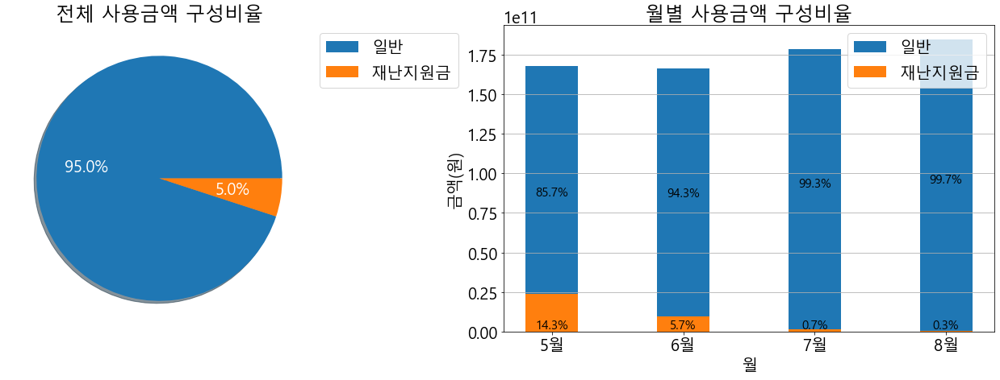

In [35]:
total = sum(all_temp_df['TotalSpent'])
dis = sum(all_temp_df['DisSpent'])/total
notdis = sum(all_temp_df['NotDisSpent'])/total
x = ['일반','재난지원금']
make_pie_bar_graph_type1(df, dis, notdis, x,'전체 사용금액 구성비율', '월별 사용금액 구성비율' )

### 시간별 사용금액
* 전체 기간 기준, 시간별로 사용금액을 합쳐 나타낸 그래프입니다.
* x시는 시간을 알 수 없으므로 제외했습니다.
* 재난지원금과 전체 사용액 모두 유사한 패턴을 보이고 있습니다.

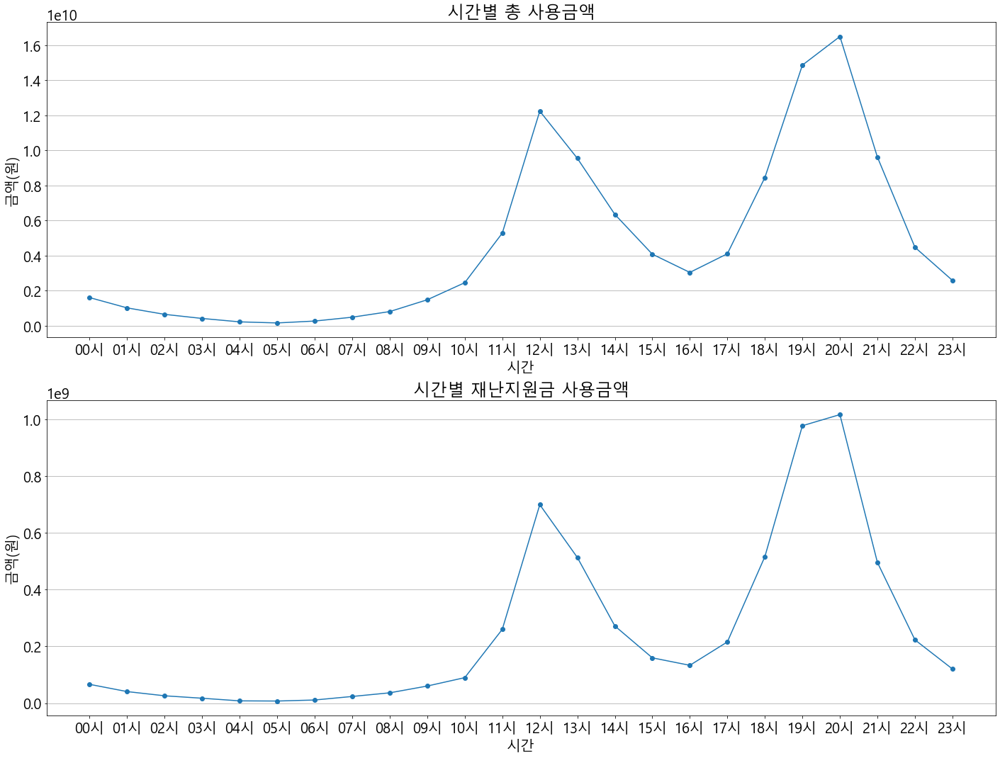

In [36]:
t_all_temp_df = all_temp_df.groupby('Time').sum().reset_index()
t_all_temp_df = t_all_temp_df[t_all_temp_df['Time'].apply(lambda x: 'x시' not in x)].reset_index(drop=True)
x = t_all_temp_df['Time']
fig, axs = plt.subplots(2, 1, figsize=(24, 18))
axs[0].plot(x, t_all_temp_df['NotDisSpent'], marker='o')
axs[0].set_title('시간별 총 사용금액')
axs[0].set_xlabel('시간')
axs[0].set_ylabel('금액(원)')
axs[0].grid(True, axis='y')

axs[1].plot(x, t_all_temp_df['DisSpent'], marker='o')
axs[1].set_title('시간별 재난지원금 사용금액')
axs[1].set_xlabel('시간')
axs[1].set_ylabel('금액(원)')
axs[1].grid(True, axis='y')
plt.show()

#### 소상공인별 일반한식 분포
* 전체 소상공인별 분포에 비해 영세가 조금 작은 등 작은 차이는 있으나 전체적인 그래프 모양은 전체 소상공인별 분포와 유사합니다.

In [37]:
t_shop_temp_df = shop_temp_df.groupby('FranClass').size().to_frame('Size').reset_index()
t_shop_temp_df = t_shop_temp_df.sort_values('Size', ascending=False).reset_index(drop=True)

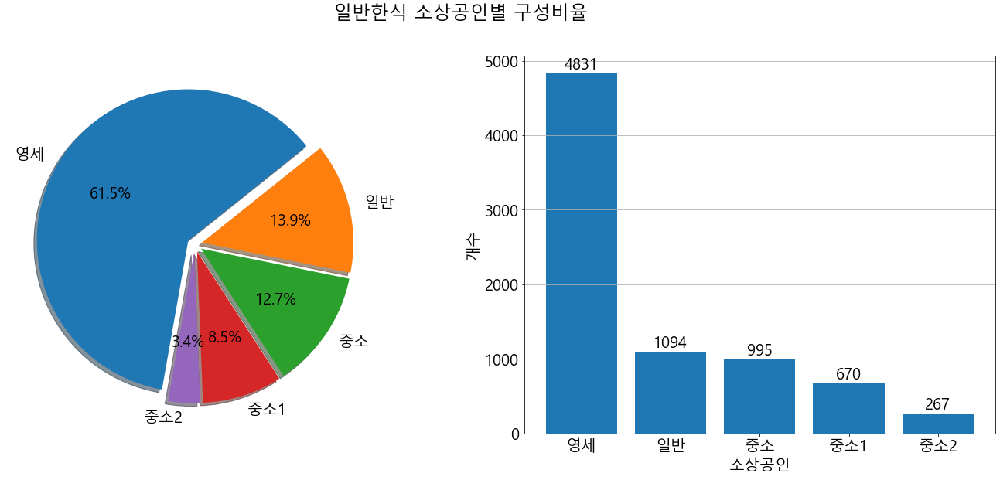

In [38]:
values = t_shop_temp_df['Size']
ratios = t_shop_temp_df['Size']/sum(t_shop_temp_df['Size'])
labels = t_shop_temp_df['FranClass']

explode = [0.05 for i in range(len(ratios))]
fig, axs = plt.subplots(1, 2, figsize=(24, 9))

axs[0].pie(values, labels=labels, autopct='%.1f%%', startangle=260, counterclock=False, explode=explode, shadow=True)
axs[1].bar(labels, values)
axs[1].set_xlabel('소상공인')
axs[1].set_ylabel('개수')
rects = axs[1].patches

for rect, value in zip(rects, values):
    height = rect.get_height()
    axs[1].text(rect.get_x() + rect.get_width() / 2, height + 5, value,
                ha='center', va='bottom')

plt.suptitle('일반한식 소상공인별 구성비율')
plt.grid(True, axis='y')
plt.show()

#### 일반한식 소상공인별 수익분석
* 각 가게의 매상을 소상공인별로 단순 groupsum으로 하면 영세가 가장 많이 소비된 것으로 나옵니다.
* 하지만 각 소상공인 그룹에 속하는 가게 1개당 소비한 전체 금액, 재난지원금을 통계로 내면 영세가 제일 작게 나옵니다. 이는 영세가 숫자가 많아서 여러 기업이 합쳐진 결과로 결국 평균적으로는 수익이 제일 적다는 것을 말합니다.
  * 중소2의 경우 제일 높게 나오는데 이는 중소2에 속한 일반한식의 경우 상점 간 사용금액의 차가 작다고 추정할 수 있습니다.

In [39]:
sg_temp_df = all_temp_df.groupby('FranClass').sum().reset_index()
sg_temp_df1 = sg_temp_df.sort_values('TotalSpent', ascending=False).reset_index(drop=True)
sg_temp_df2 = sg_temp_df.sort_values('DisSpent', ascending=False).reset_index(drop=True)

D:\ProgramData\Anaconda3\envs\hwan\lib\site-packages\ipykernel_launcher.py:86: UserWarning:

FixedFormatter should only be used together with FixedLocator



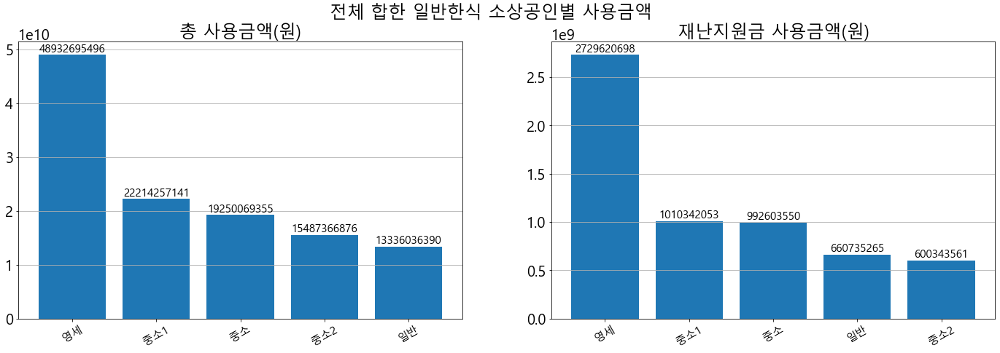

In [40]:
fig, axs = plt.subplots(1, 2, figsize=(24, 7))
axs[0] = plot_bar_graph(sg_temp_df1['FranClass'],sg_temp_df1['TotalSpent'], '총 사용금액(원)', axs[0], fontsize=15)
axs[1] = plot_bar_graph(sg_temp_df2['FranClass'],sg_temp_df2['DisSpent'], '재난지원금 사용금액(원)', axs[1], fontsize=15)
plt.suptitle('전체 합한 일반한식 소상공인별 사용금액')
plt.show()

D:\ProgramData\Anaconda3\envs\hwan\lib\site-packages\ipykernel_launcher.py:86: UserWarning:

FixedFormatter should only be used together with FixedLocator



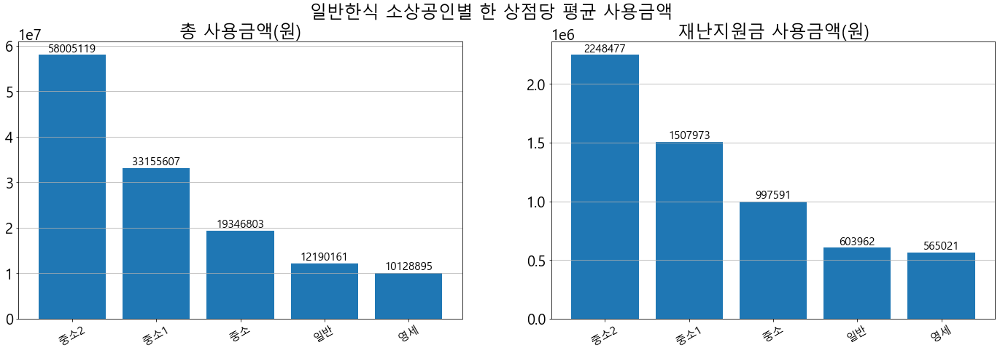

In [41]:
mg_temp_df = all_temp_df.groupby(keys).sum().reset_index()
mg_temp_df = mg_temp_df.groupby('FranClass').mean().reset_index()
mg_temp_df['TotalSpent'] = mg_temp_df['TotalSpent'].apply(lambda x: int(x))
mg_temp_df['DisSpent'] = mg_temp_df['DisSpent'].apply(lambda x: int(x))

mg_temp_df1 = mg_temp_df.sort_values('TotalSpent', ascending=False).reset_index()
mg_temp_df2 = mg_temp_df.sort_values('DisSpent', ascending=False).reset_index()


fig, axs = plt.subplots(1, 2, figsize=(24,7))
axs[0] = plot_bar_graph(mg_temp_df1['FranClass'],mg_temp_df2['TotalSpent'], '총 사용금액(원)', axs[0], fontsize=15)
axs[1] = plot_bar_graph(mg_temp_df2['FranClass'],mg_temp_df2['DisSpent'], '재난지원금 사용금액(원)', axs[1], fontsize=15)
plt.suptitle('일반한식 소상공인별 한 상점당 평균 사용금액')
plt.show()

### 일반한식 사용금액 분포
* 업종이 일반한식인 상점들의 전체 기간동안 사용금액 분포를 분석합니다.
* boxplot, 히스토그램으로 분석합니다.
* 사용금액이 적은 곳과 많은 곳의 차이가 심한 것을 볼 수 있습니다.

In [42]:
temp_df = all_temp_df.groupby(keys).sum().reset_index()
temp_df1 = temp_df.sort_values('TotalSpent', ascending=False).reset_index(drop=True)
temp_df2 = temp_df.sort_values('DisSpent', ascending=False).reset_index(drop=True)

Boxplot

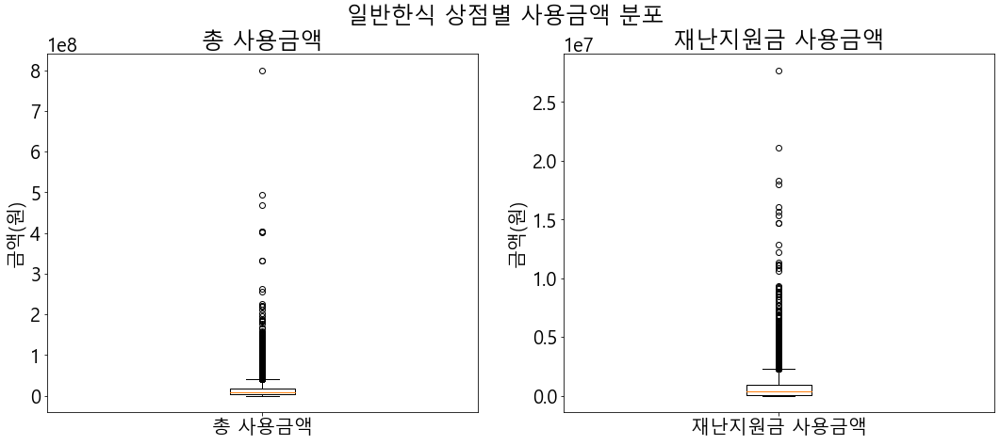

In [43]:
fig, axs = plt.subplots(1, 2, figsize=(18, 7))
axs[0].boxplot(temp_df1['TotalSpent'])
axs[0].set_xticklabels(['총 사용금액'])
axs[0].set_title('총 사용금액')
axs[0].set_ylabel('금액(원)')

axs[1].boxplot(temp_df2['DisSpent'])
axs[1].set_xticklabels(['재난지원금 사용금액'])
axs[1].set_title('재난지원금 사용금액')
axs[1].set_ylabel('금액(원)')

plt.suptitle('일반한식 상점별 사용금액 분포')
plt.show()

histogram

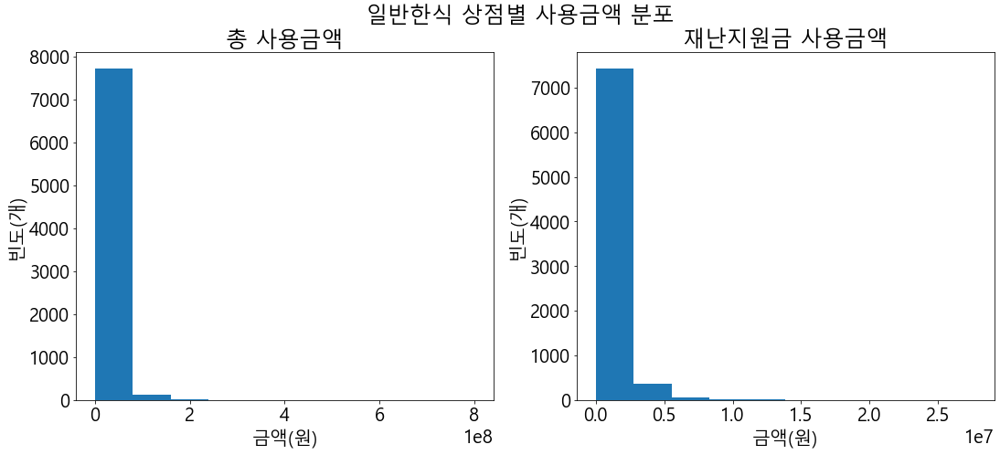

In [44]:
fig, axs = plt.subplots(1, 2, figsize=(18, 7))
plt.suptitle('일반한식 상점별 사용금액 분포')
axs[0].hist(temp_df1['TotalSpent'])
axs[0].set_title('총 사용금액')
axs[0].set_xlabel('금액(원)')
axs[0].set_ylabel('빈도(개)')

axs[1].hist(temp_df2['DisSpent'])
axs[1].set_title('재난지원금 사용금액')
axs[1].set_xlabel('금액(원)')
axs[1].set_ylabel('빈도(개)')
plt.show()

#### 일반한식 소상공인별 사용금액 분포
* 일반한식 상점의 소상공인별 총 사용금액, 재난지원금 사용금액 분포를 나타낸 그래프입니다.
* 이를 통해 상점간 사용금액 격차의 정도를 분석할 수 있습니다.  
* 총 사용금액, 재난지원금 모두 각 소상공인에 대해 같은 패턴을 보이고 있으나 재난지원금이 좀 더 상점간 사용금액 격차가 크다는 것을 나타내고 있습니다.
* 소상공인 중 일반, 영세의 경우 소수의 기업들이 많은 사용금액을 가져갔으며 상점 간 사용금액의 차이가 큽니다.
* 중소의 경우 정규분포 형태는 아니지만 다른 소상공인에 비해 이상치로 된 사용금액이 훨씬 적으며 비교적 고른 분포를 보이고 있습니다.

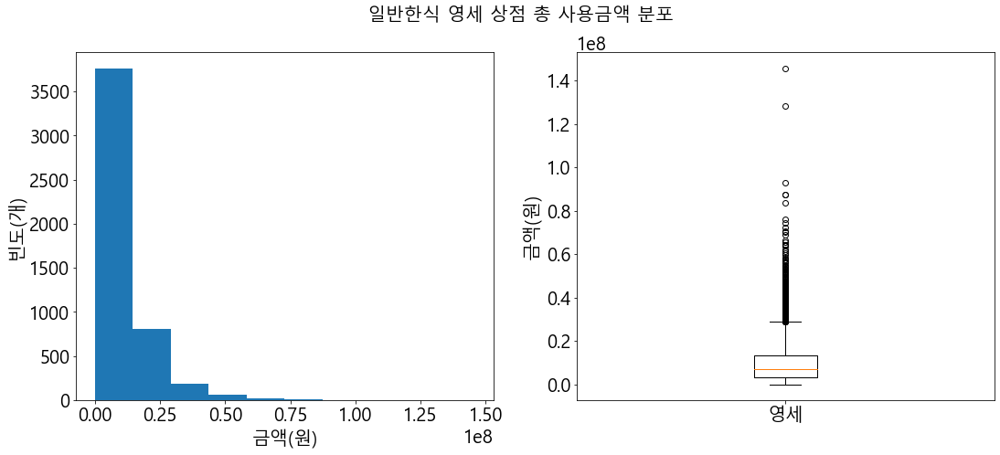

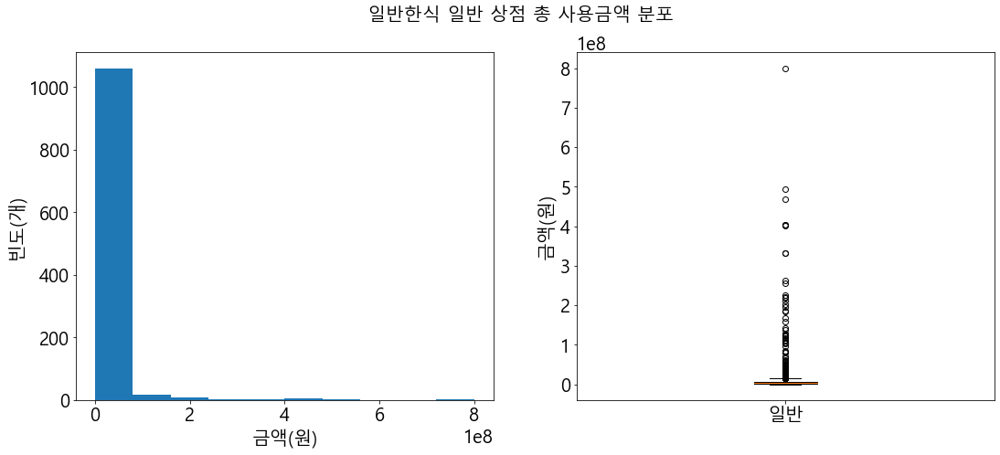

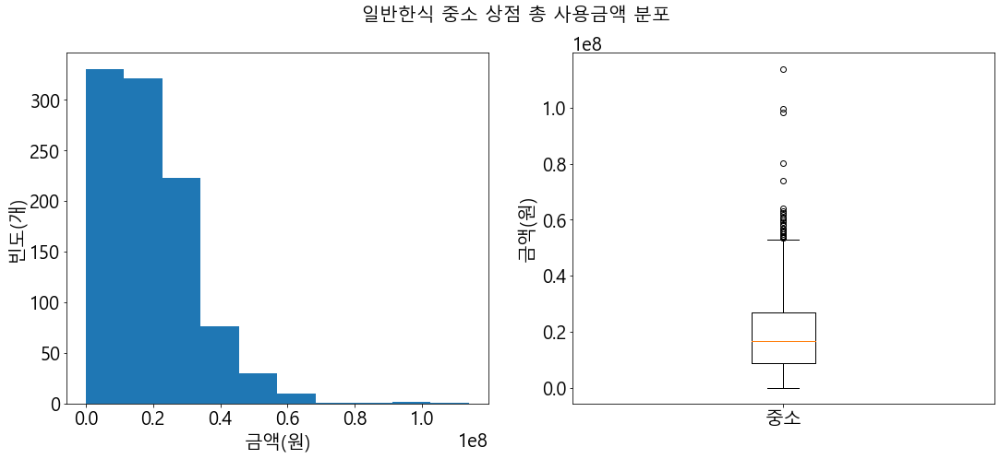

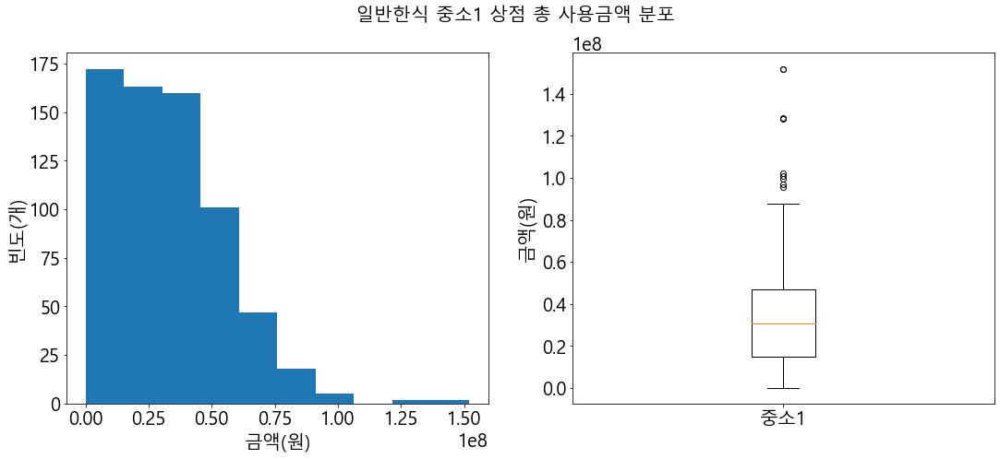

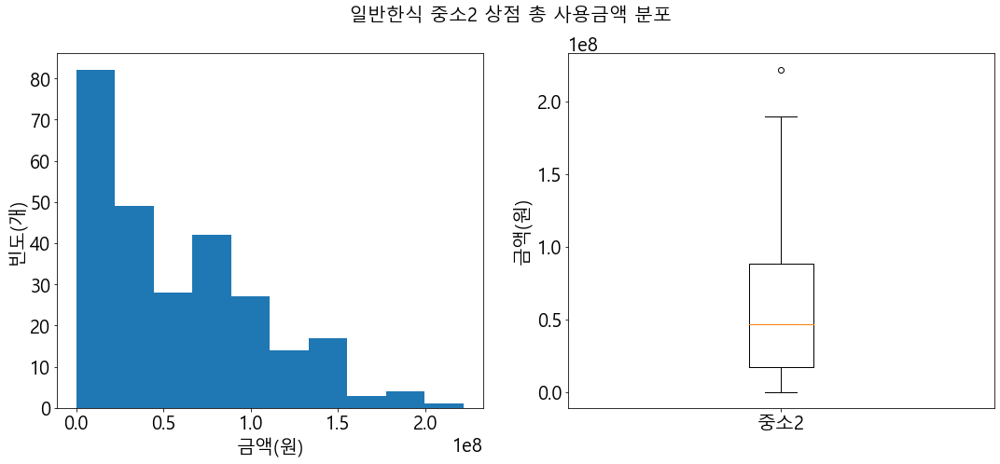

In [45]:
col_keys = np.unique(all_temp_df['FranClass'])
t_all_temp_df = all_temp_df.groupby(keys).sum().reset_index()
for col_key in col_keys:
    tt_all_temp_df = t_all_temp_df[t_all_temp_df['FranClass']==col_key].reset_index(drop=True)
    fig, axs = plt.subplots(1, 2, figsize=(18, 7))
    plt.suptitle('일반한식 %s 상점 총 사용금액 분포'%(col_key),fontsize=20)
    axs[0].hist(tt_all_temp_df['TotalSpent'])
    axs[0].set_xlabel('금액(원)')
    axs[0].set_ylabel('빈도(개)')
    
    axs[1].boxplot(tt_all_temp_df['TotalSpent'])
    
    
    axs[1].set_xticklabels([col_key])
    axs[1].set_ylabel('금액(원)')
    plt.show()

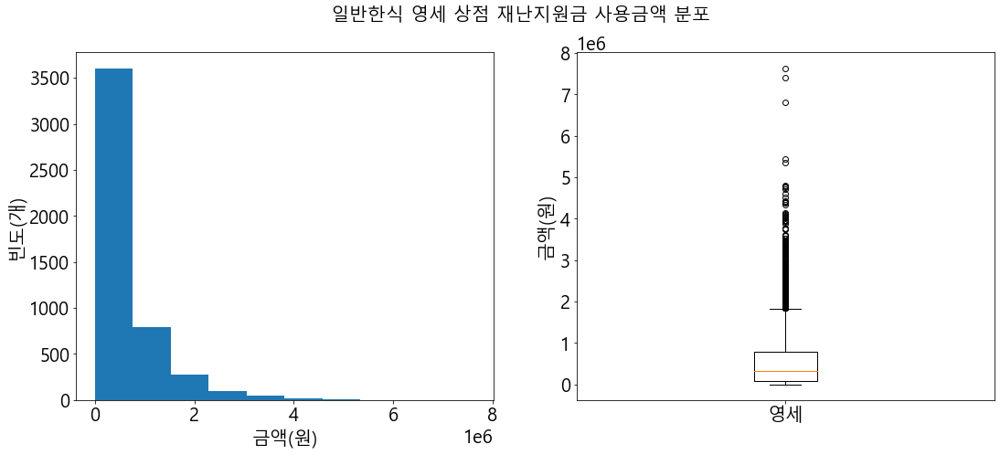

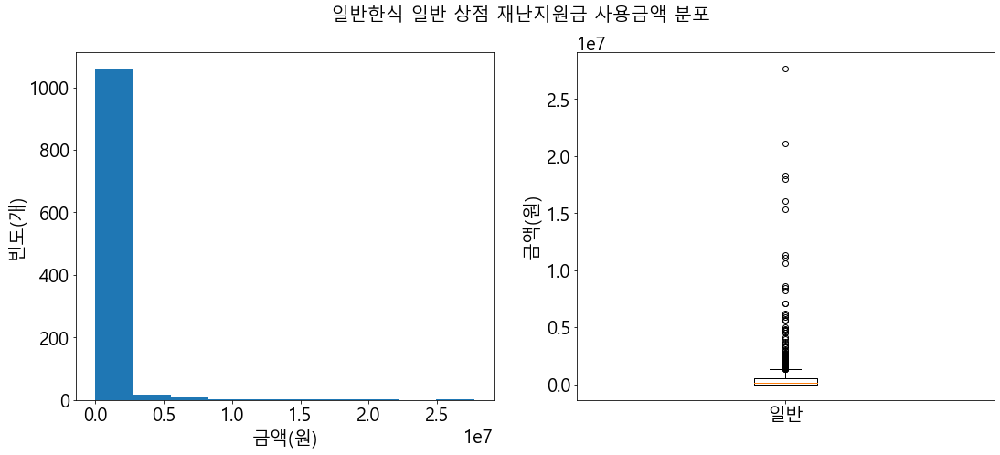

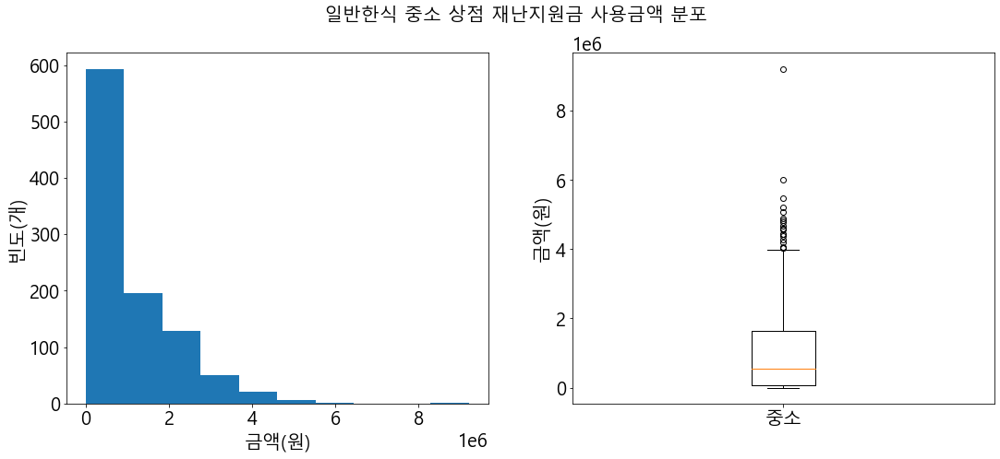

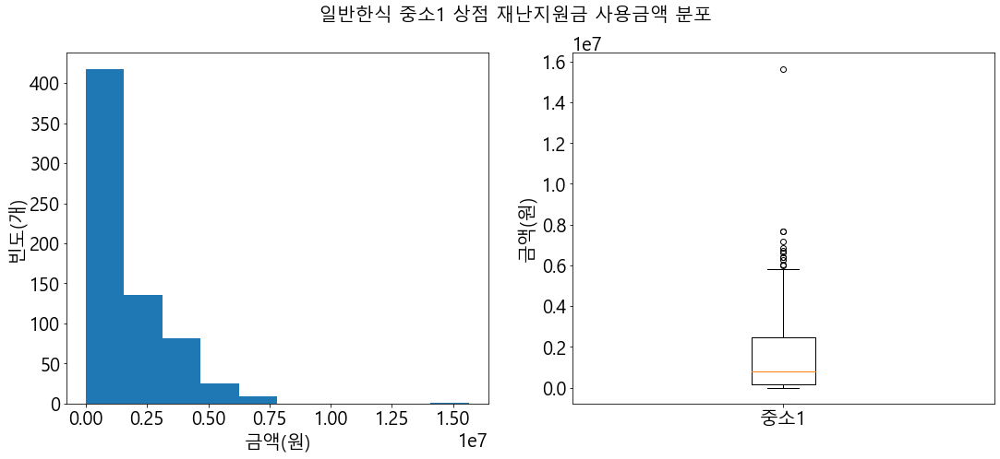

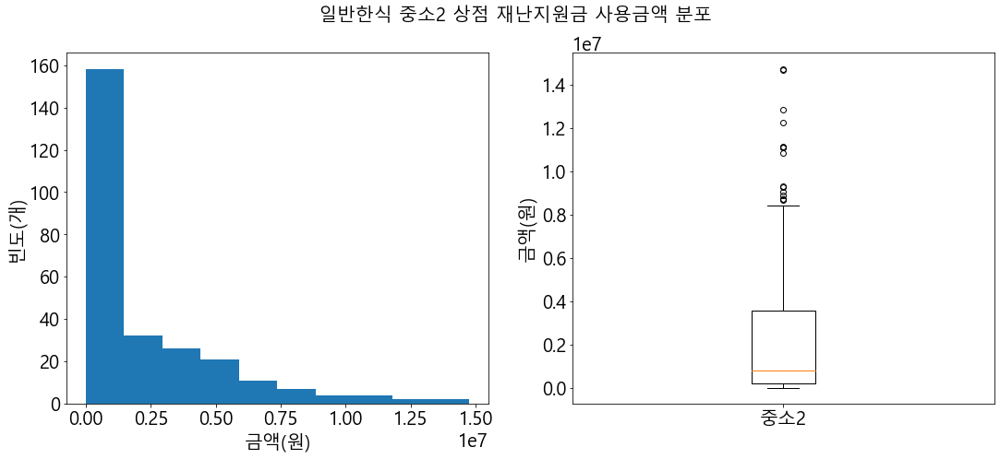

In [46]:
col_keys = np.unique(all_temp_df['FranClass'])
t_all_temp_df = all_temp_df.groupby(keys).sum().reset_index()
for col_key in col_keys:
    tt_all_temp_df = t_all_temp_df[t_all_temp_df['FranClass']==col_key].reset_index(drop=True)
    fig, axs = plt.subplots(1, 2, figsize=(18, 7))
    plt.suptitle('일반한식 %s 상점 재난지원금 사용금액 분포'%(col_key),fontsize=20)

    axs[0].hist(tt_all_temp_df['DisSpent'])
    axs[0].set_xlabel('금액(원)')
    axs[0].set_ylabel('빈도(개)')
    axs[1].boxplot(tt_all_temp_df['DisSpent'])
    axs[1].set_xticklabels([col_key])
    axs[1].set_ylabel('금액(원)')
    
    plt.show()

### 일반한식 월별 소상공인별 사용금액 분포
* 위의 분석을 월별로 나눠 분석한 것으로, 전체 기간과 다른 부분이 있을 수도 있다는 가정하에 실시했습니다.
* 총, 재난지원금 사용금액 모두 월별 차이는 크지 않은 것 같습니다.
* 재난지원금 사용금액의 경우 재난지원금 소모액이 감소하므로 전체적으로 그래프가 줄어드는 것을 볼 수 있습니다.

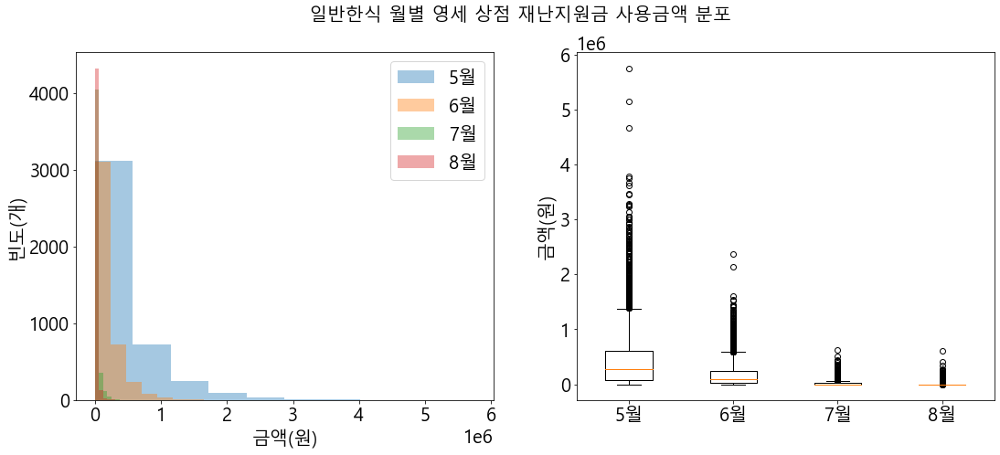

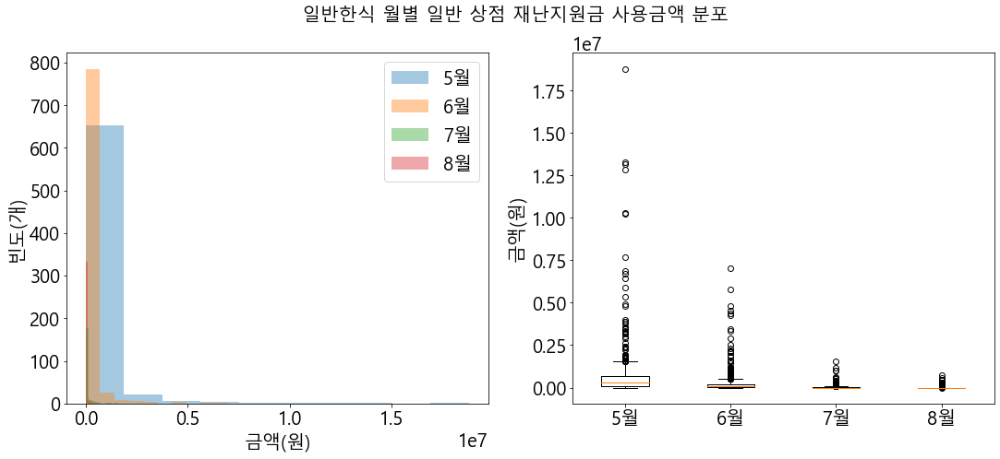

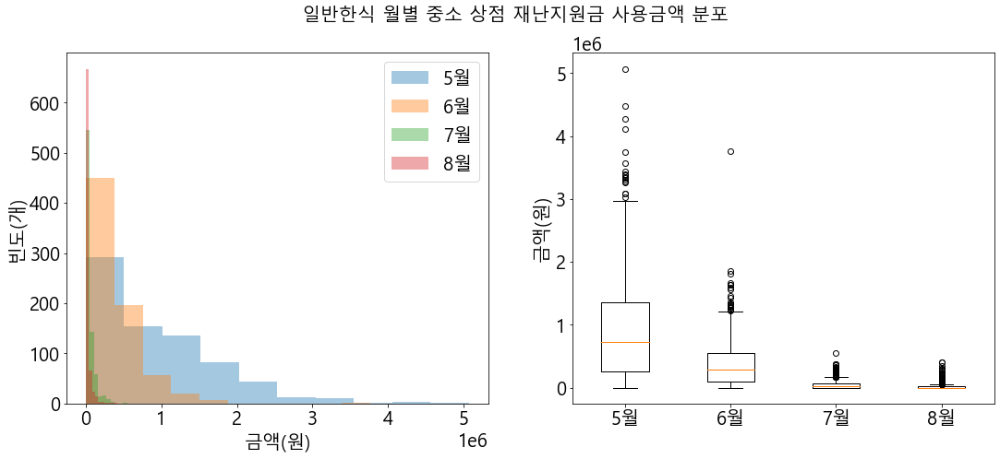

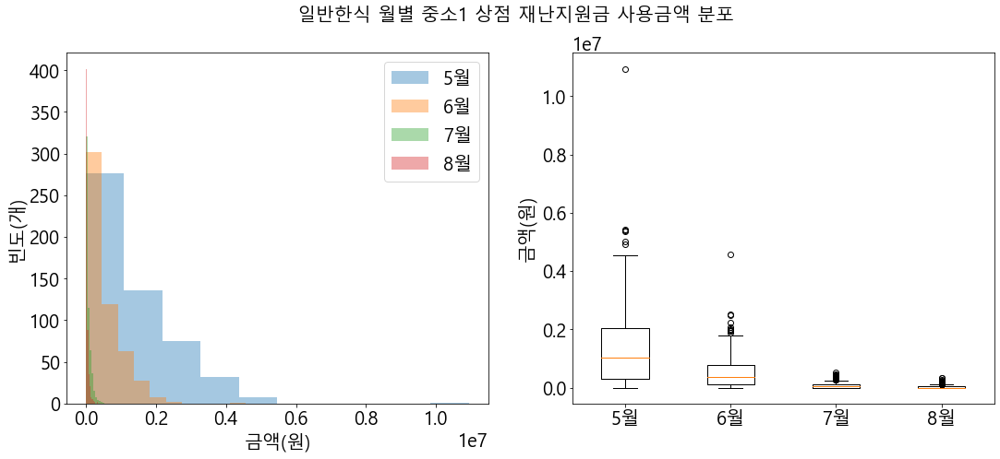

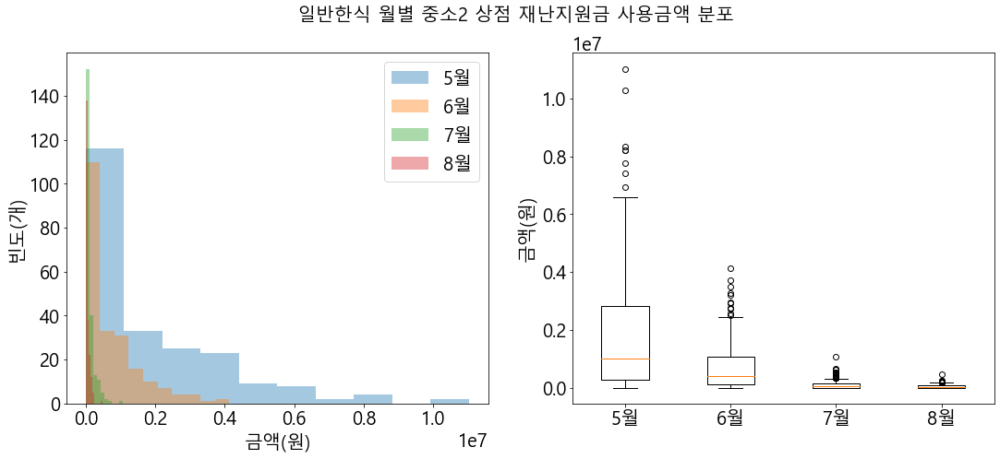

In [47]:
col_keys = np.unique(all_temp_df['FranClass'])
t_all_temp_df = all_temp_df.groupby(keys+['YM']).sum().reset_index()
for col_key in col_keys:
    tt_all_temp_df = t_all_temp_df[t_all_temp_df['FranClass']==col_key].reset_index(drop=True)
    fig, axs = plt.subplots(1, 2, figsize=(18, 7))

    boxes = []

    for month in unique_months:
        ttt_all_temp_df = tt_all_temp_df[tt_all_temp_df['YM']==month].reset_index(drop=True)
        
        plt.suptitle('일반한식 월별 %s 상점 재난지원금 사용금액 분포'%(col_key),fontsize=20)
        axs[0].hist(ttt_all_temp_df['DisSpent'], label='%s월'%(str(month)[5]), alpha=0.4)
        axs[0].set_xlabel('금액(원)')
        axs[0].set_ylabel('빈도(개)')
        boxes.append(ttt_all_temp_df['DisSpent'].tolist())

    axs[0].legend()
    axs[1].boxplot(boxes)
    axs[1].set_xticklabels(['5월','6월','7월','8월'])
    axs[1].set_ylabel('금액(원)')
    plt.show()

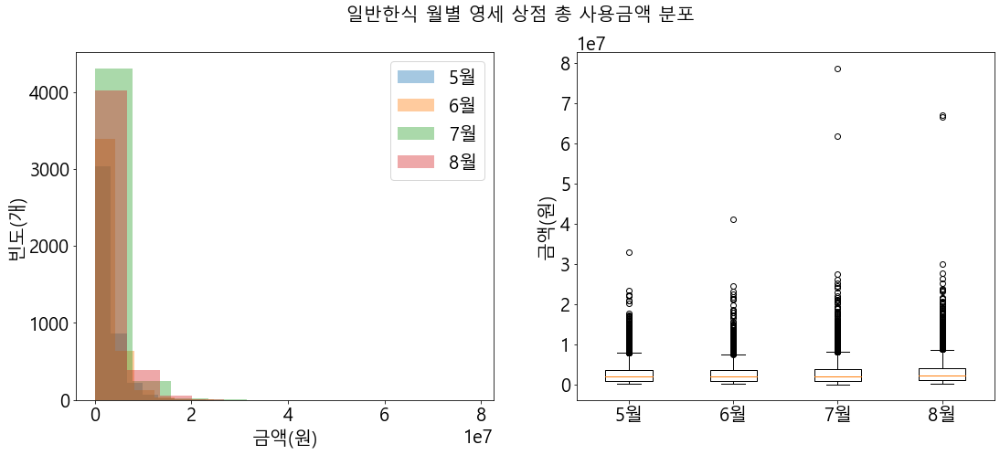

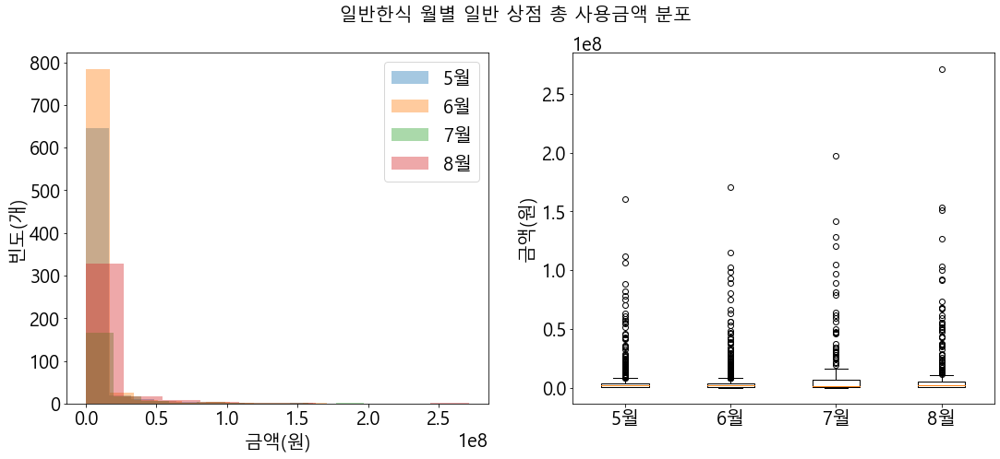

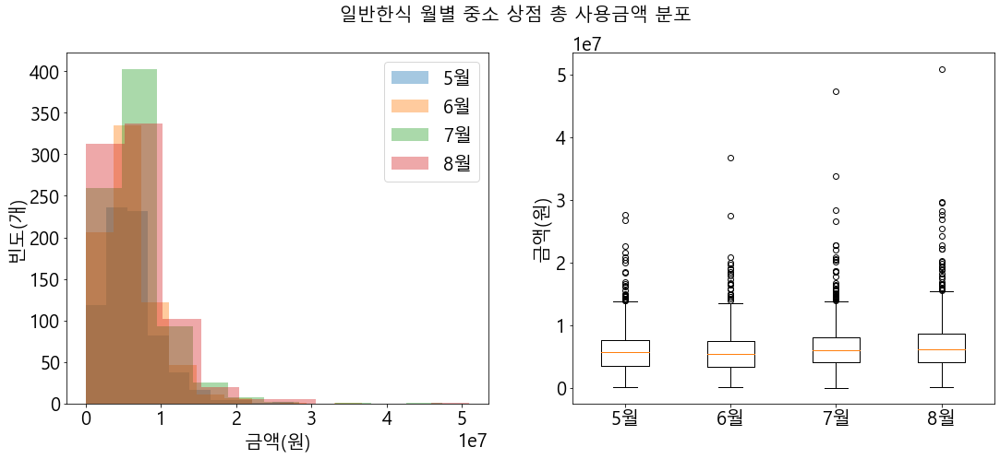

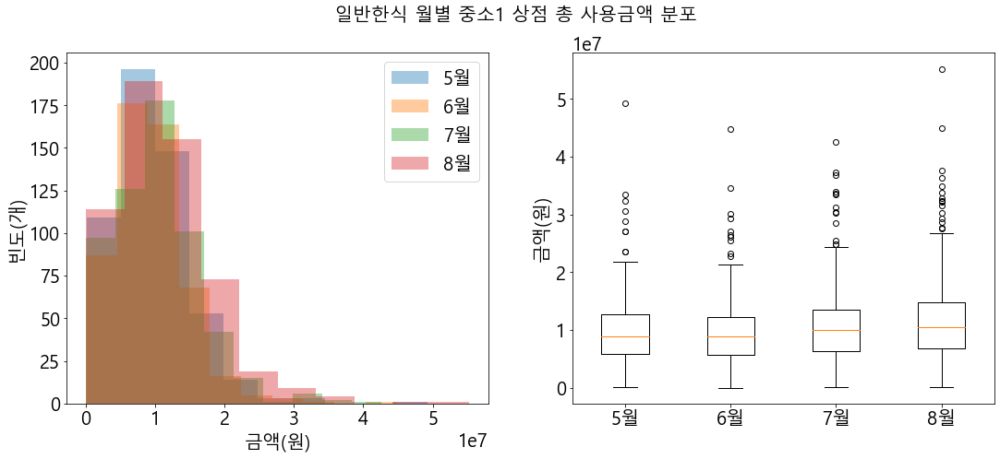

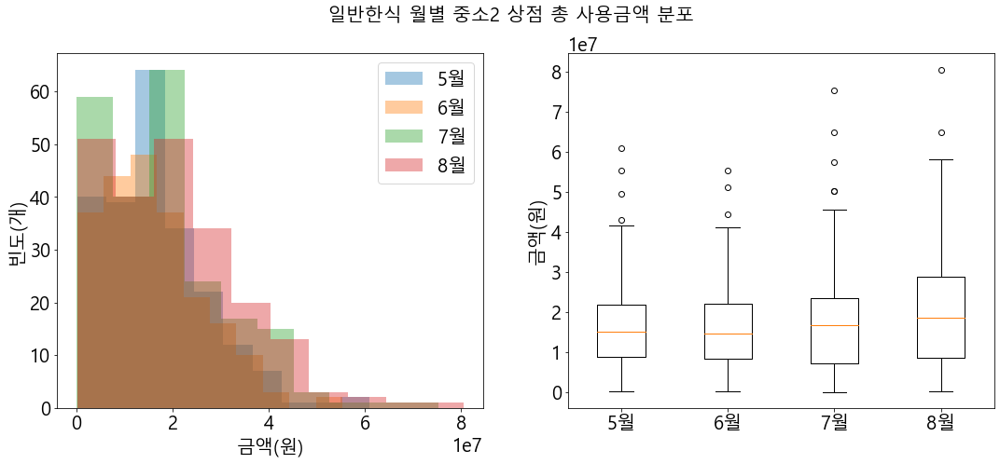

In [48]:
col_keys = np.unique(all_temp_df['FranClass'])
t_all_temp_df = all_temp_df.groupby(keys+['YM']).sum().reset_index()
for col_key in col_keys:
    tt_all_temp_df = t_all_temp_df[t_all_temp_df['FranClass']==col_key].reset_index(drop=True)
    fig, axs = plt.subplots(1, 2, figsize=(18, 7))
    boxes = []
    for month in unique_months:
        ttt_all_temp_df = tt_all_temp_df[tt_all_temp_df['YM']==month].reset_index(drop=True)
        
        plt.suptitle('일반한식 월별 %s 상점 총 사용금액 분포'%(col_key),fontsize=20)
        axs[0].hist(ttt_all_temp_df['TotalSpent'], label='%s월'%(str(month)[5]), alpha=0.4)
        axs[0].set_xlabel('금액(원)')
        axs[0].set_ylabel('빈도(개)')
        boxes.append(ttt_all_temp_df['TotalSpent'].tolist())
        
    axs[0].legend()
    axs[1].boxplot(boxes)
    axs[1].set_xticklabels(['5월','6월','7월','8월'])
    axs[1].set_ylabel('금액(원)')
    plt.show()

### 일반한식 좌표 시각화
* 어떤 위치에서 재난지원금, 총 사용금액이 높은지 분석하기 위해 실시했습니다.

In [49]:
temp_df2 = df[df['Type']=='일반한식']
temp_df2 = temp_df2.groupby(['POINT_X','POINT_Y']).sum().reset_index()
temp_df2 = pd.merge(temp_df2, coor_df, on=['POINT_X','POINT_Y'], how='left')

#### 일반한식 상점 총 사용금액 분포
* 원 크기가 클수록, 색깔이 밝을수록 높은 사용금액을 기록한 상점입니다.
* 전체적으로 주요 관광지 쪽이 사용금액이 높은 것을 볼 수 있습니다.

In [50]:
fig2 = px.scatter_mapbox(temp_df2, lat="POINT_Y2", lon="POINT_X2", color="TotalSpent",
                         mapbox_style="carto-positron",
                  color_continuous_scale="magma", size_max=40, zoom=9,opacity=0.3, size="TotalSpent")

#fig.show()
fig2.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig2.show()

일반한식 상점 재난지원금 사용금액 분포
* 총 사용금액과 유사한 것을 볼 수 있습니다.

In [51]:
fig2 = px.scatter_mapbox(temp_df2, lat="POINT_Y2", lon="POINT_X2", color="DisSpent",
                         mapbox_style="carto-positron",
                  color_continuous_scale="magma", size_max=40, zoom=9,opacity=0.3, size="DisSpent")

#fig.show()
fig2.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig2.show()

## 2-3. 이용건수
이용건수에 대한 분석으로 이 부분은 사용금액이랑 유사할 것으로 판단하여 구성비율만 분석했습니다.

### 전체, 월별 이용횟수 구성비율
* 위의 사용금액이랑 유사한 패턴을 보입니다.

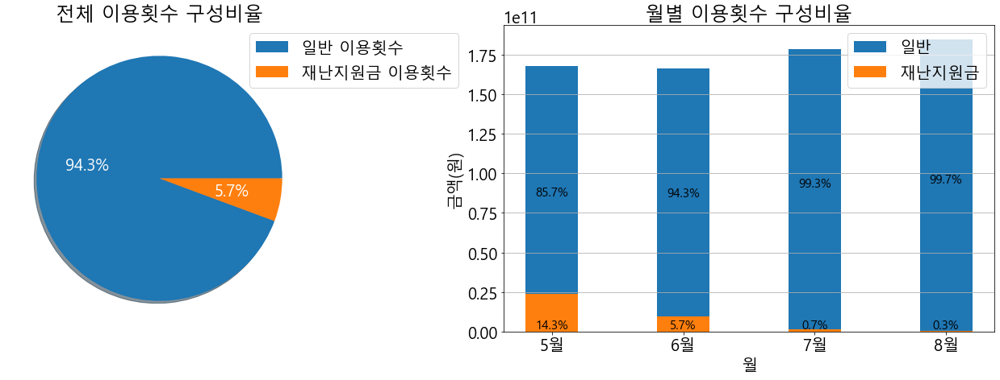

In [52]:
total = sum(df['NumofSpent'])
dis = sum(df['NumofDisSpent'])
notdis = sum(df['NumofNotDisSpent'])

ratio_dis, ratio_notdis = dis/total, notdis/total
x = ['일반 이용횟수','재난지원금 이용횟수']

make_pie_bar_graph_type1(df, ratio_dis, ratio_notdis, x,'전체 이용횟수 구성비율', '월별 이용횟수 구성비율' )

## 2-4. 소상공인분류
제주도의 전체적인 소상공인 구성을 봅니다

### 요약 
* 각 상점의 소상공인비율은 영세가 60% 이상으로 제일 높습니다.
* 모든 소상공인에서 일반한식이 제일 높은 비율의 업종을 기록했습니다.
* 영세의 경우 서양음식, 기타숙박업의 비중이 높은데 이는 관광지 특성상 조그만한 숙소를 운영하는 업체가 많은 것으로 추정할 수 있습니다.
* 7월에 상점에서 일반 소상공인 비율이 급감하는 것을 볼 수 있습니다. 특히 업종 중 일반한식에서 두드러지게 나타나며 일반한식 기준, 공간데이터 분석 결과 없어진 상점은 주로 총 사용금액이 적었던 상점이었습니다.

### 4개월 동안 등장한 제주도에 있는 가게의 소상공인분류
* 그래프를 보면 제주도는 전체 가게의 60% 이상이 영세업자로 위의 일반한식 소상공인 비율과 유사합니다.

In [53]:
temp_df = df.groupby(keys).sum().reset_index()
temp_df = temp_df.groupby('FranClass').size().to_frame('Size').reset_index()
temp_df = temp_df.sort_values('Size',ascending=False).reset_index(drop=True)

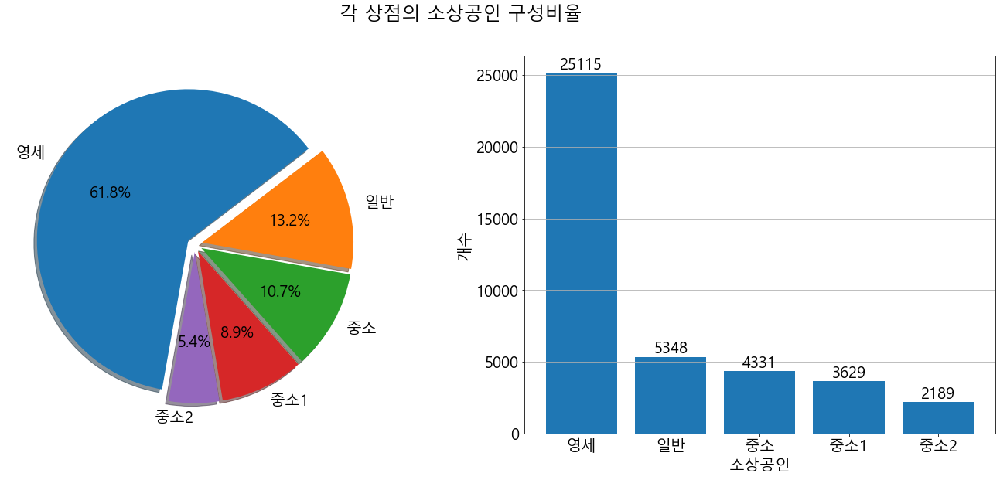

In [54]:
labels = temp_df['FranClass']
values = temp_df['Size']
ratios = temp_df['Size']/sum(temp_df['Size'])

explode = [0.05 for i in range(len(ratios))]
fig, axs = plt.subplots(1, 2, figsize=(24, 9))

axs[0].pie(values, labels=labels, autopct='%.1f%%', startangle=260, counterclock=False, explode=explode, shadow=True)
axs[1].bar(labels, values)
axs[1].set_xlabel('소상공인')
axs[1].set_ylabel('개수')
rects = axs[1].patches

for rect, value in zip(rects, values):
    height = rect.get_height()
    axs[1].text(rect.get_x() + rect.get_width() / 2, height + 5, value,
                ha='center', va='bottom')

plt.suptitle('각 상점의 소상공인 구성비율')
plt.grid(True, axis='y')
plt.show()

### 소상공인별 업종
소상공인별 업종을 나타내기 위한 그래프로 상위 20개를 기준으로 했으며 다른 기준은 이전에 업종 관련 분석에서 나온 원그래프와 같습니다.

* 전체적으로 한식 식당이 제일 많게 나옵니다.
* 영세의 경우 서양음식, 기타숙박업의 비중이 높은데 이는 관광지 특성상 조그만한 숙소를 운영하는 업체가 많은 것으로 추정할 수 있습니다. 
* 중소, 중소1의 경우 한식 식당 다음으로 편의점의 비중이 높습니다. 
* 중소2의 경우 일반한식 다음으로 농축수산품의 비중이 제일 높으며 업종의 비율 편차가 제일 작게 나타납니다.
* 일반의 경우 한식과 서양음식이 30%를 넘게 차지하고 있습니다. 영세에서도 이는 유사하게 나타납니다.


In [55]:
temp_df = df.groupby(keys).sum().reset_index()
key_cols = np.unique(df['FranClass'])
num = 20

fig = go.Figure()
sw_v = False
for i, key_col in enumerate(key_cols):
    if i == 0:
        sw_v = True
    else:
        sw_v = False
    t_temp_df = temp_df[temp_df['FranClass']==key_col].reset_index(drop=True)
    t_temp_df = t_temp_df.groupby('Type').size().to_frame('Size').reset_index()
    t_temp_df = t_temp_df.sort_values('Size', ascending=False).reset_index(drop=True)
    sums = sum(t_temp_df.loc[num:,'Size'])
    t_temp_df = t_temp_df.loc[:num-1,:]
    t_temp_df.loc[num,:] = ['다른 업종',sums]
    fig.add_trace(
        go.Pie(
            labels=t_temp_df.Type, 
            values=t_temp_df.Size,
            name = key_col,
            visible = sw_v
        )
    )


button_dict1 = make_button_dict('영세', [True, False, False, False,False], '영세 소상공인 업종 비중')
button_dict2 = make_button_dict('일반', [False, True, False, False, False], '일반 소상공인 업종 비중')
button_dict3 = make_button_dict('중소', [False, False, True, False, False], '중소 소상공인 업종 비중')
button_dict4 = make_button_dict('중소1', [False, False, False, True, False], '중소1 소상공인 업종 비중')
button_dict5 = make_button_dict('중소2', [False, False, False, False, True], '중소2 소상공인 업종 비중')

fig.update_layout(

    updatemenus=[go.layout.Updatemenu(
        active=0,
        buttons=list(
            [button_dict1,
             button_dict2,
             button_dict3,
             button_dict4,
             button_dict5,
            ])
        )
    ])

fig.show()


#### 4개월 동안 등장한 제주도에 있는 가게의 소상공인분류
월간 기준으로 등장한 상점들을 소상공인별로 분류하여 각각의 개수를 구합니다.

* 7월이 특이하게 일반의 비중이 감소했으나 영세가 증가하여 전체 가게 개수는 크게 감소하지 않습니다.

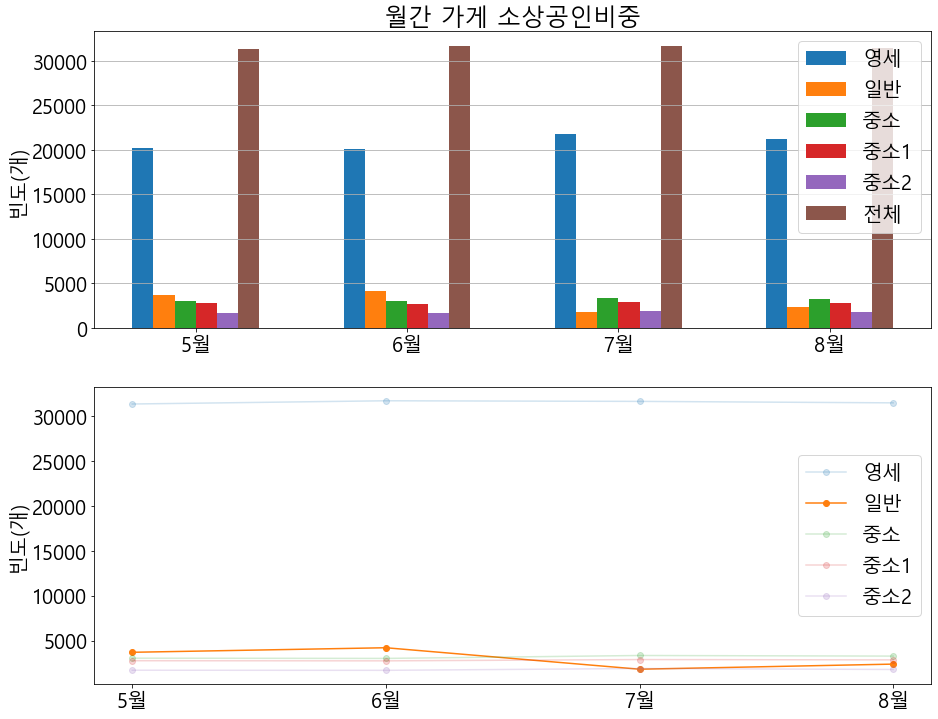

In [56]:
temp_df = df.groupby(keys+['YM']).sum().reset_index()
temp_df = temp_df.groupby(['FranClass','YM']).size().to_frame('Size').reset_index()
col_keys = np.unique(df['FranClass'])
temp_dict = {}
for col_key in col_keys:
    t_temp_df = temp_df[temp_df['FranClass']==col_key]
    temp_dict[col_key] = t_temp_df['Size'].values.reshape(-1,)
    
fig, axs = plt.subplots(2, 1, figsize=(15, 12))
x = ['5월','6월','7월','8월']
sums = []

temp_x = np.array([0,2,4,6])
pos = -0.5
for col_key in col_keys:
    values = temp_dict[col_key]
    if len(sums)!=0:
        sums +=values
        
    else:
        sums = values
    #axs.plot(temp_x+pos,values, label=col_key, marker='o')
    axs[0].bar(temp_x+pos, values, width=0.2, label=col_key)
    pos += 0.2

#axs.plot(temp_x+pos,sums, label='all', marker='o')
axs[0].set_xticks(temp_x)
axs[0].set_xticklabels(x)
axs[0].grid(True, axis='y')
axs[0].bar(temp_x+pos,sums, width=0.2, label='전체')
axs[0].set_title('월간 가게 소상공인비중')
axs[0].set_ylabel('빈도(개)')
axs[0].legend()

for col_key in col_keys:
    values = temp_dict[col_key]
    if col_key == '일반':
        axs[1].plot(x, values, label=col_key, marker='o')
    else:
        axs[1].plot(x, values, label=col_key, marker='o', alpha=0.2)
axs[1].set_ylabel('빈도(개)')
axs[1].legend()

plt.show()


### 6, 7월의 FranClass 분석
일반이 갑자기 7월에 감소하는 이유에 대해 분석하기 위해 6월과 7월의 각 상점의 소상공인 비율을 분석합니다..

* 영세가 63%에서 68%로 급증하며 일반은 13%에서 5%대로 급락합니다.
* 위치가 같은지 비교해야하지만 일단 일반 업종이 줄은 만큼 영세가 늘어난 것으로 추정할 수 있습니다.

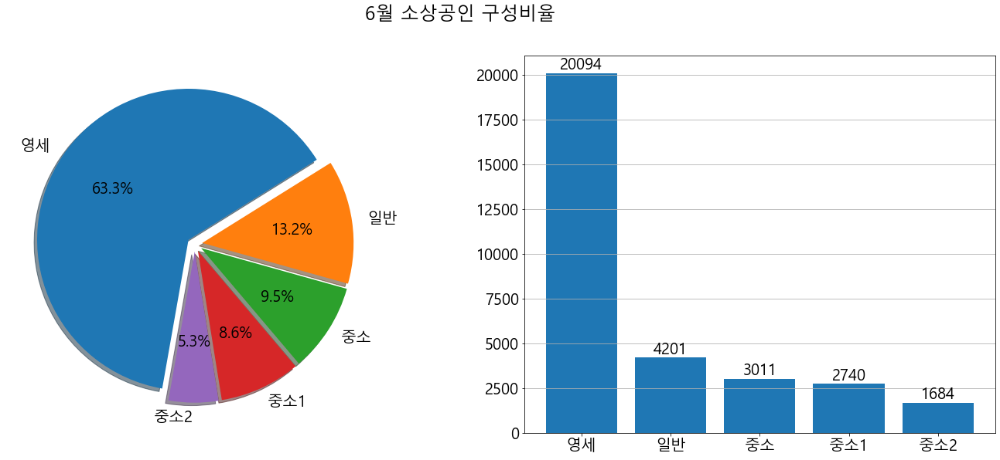

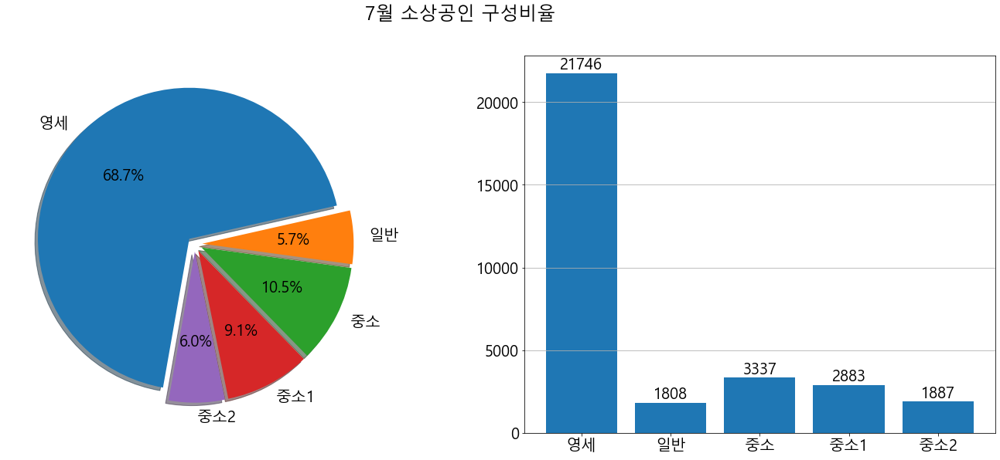

In [57]:
temp_months = ['6월','7월']
temp_yms = [202006,202007]
for i in range(len(temp_yms)):
    ym = temp_yms[i]
    temp_df = df[df['YM']==ym].reset_index(drop=True)
    temp_df = temp_df.groupby(keys).sum().reset_index()
    temp_df= temp_df.groupby(['FranClass']).size().to_frame('Size').reset_index()

    labels = temp_df['FranClass'].tolist()
    ratios = (temp_df['Size']/sum(temp_df['Size'])).values.reshape(-1,)
    values = temp_df['Size'].values.reshape(-1,)
    explode = [0.05 for i in range(len(ratios))]
    fig, axs = plt.subplots(1, 2, figsize=(24, 9))

    axs[0].pie(ratios, labels=labels, autopct='%.1f%%', startangle=260, counterclock=False, explode=explode, shadow=True)

    axs[1].bar(labels, values)

    rects = axs[1].patches

    for rect, value in zip(rects, values):
        height = rect.get_height()
        axs[1].text(rect.get_x() + rect.get_width() / 2, height + 5, value,
                    ha='center', va='bottom')

    plt.grid(True, axis='y')
    plt.suptitle('%s 소상공인 구성비율'%(temp_months[i]))
    plt.show()

#### 7월의 업종비율
7월의 소상공인별 각 상점의 업종 비율을 봅니다.

* 일반의 경우 한식이 10% 가까이 감소하는데 이들이 업종 또는 소상공인 변경을 한 것으로 추정됩니다. 왜냐하면 전체 상점 개수는 전달에 비해 크게 감소하지 않았기 때문입니다.

In [58]:
temp_df = df[df['YM']==202007].reset_index(drop=True)
temp_df = temp_df.groupby(keys).sum().reset_index()
key_cols = np.unique(df['FranClass'])
num = 20

In [59]:
temp_df = df[df['YM']==202007].reset_index(drop=True)
temp_df = temp_df.groupby(keys).sum().reset_index()
key_cols = np.unique(df['FranClass'])
num = 15

fig = go.Figure()
sw_v = True
for i, key_col in enumerate(key_cols):
    if i == 0:
        sw_v = True
    else:
        sw_v = False
    t_temp_df = temp_df[temp_df['FranClass']==key_col].reset_index(drop=True)
    t_temp_df = t_temp_df.groupby('Type').size().to_frame('Size').reset_index()
    t_temp_df = t_temp_df.sort_values('Size', ascending=False).reset_index(drop=True)
    sums = sum(t_temp_df.loc[num:,'Size'])
    t_temp_df = t_temp_df.loc[:num-1,:]
    t_temp_df.loc[num,:] = ['다른 업종',sums]
    fig.add_trace(
        go.Pie(
            labels=t_temp_df.Type, 
            values=t_temp_df.Size,
            name = key_col,
            visible=sw_v
        )
    )

    
    
button_dict1 = make_button_dict('영세', [True, False, False, False,False], '7월 영세 소상공인 업종 비중')
button_dict2 = make_button_dict('일반', [False, True, False, False, False], '7월 일반 소상공인 업종 비중')
button_dict3 = make_button_dict('중소', [False, False, True, False, False], '7월 중소 소상공인 업종 비중')
button_dict4 = make_button_dict('중소1', [False, False, False, True, False], '7월 중소1 소상공인 업종 비중')
button_dict5 = make_button_dict('중소2', [False, False, False, False, True], '7월 중소2 소상공인 업종 비중')

fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active=0,
        buttons=list(
            [button_dict1,button_dict2,button_dict3,button_dict4,button_dict5
            ])
        )
    ])

fig.show()

#### 공간데이터를 활용한 분석
일반한식 상점 중 일반인 경우 6월과 7월에 어떤 차이가 있는지 지도를 통해 분석합니다.

* 원 크기가 클수록 또는 색깔이 밝을수록(colorbar 참조) 총 사용금액이 크다는 것을 의미합니다.
* 6월에 비해 7월에 사용금액이 적었던 일반 상점이 사라진 것을 볼 수 있습니다.

In [60]:
temp_df = df[(df['Type']=='일반한식')&(df['FranClass']=='일반')]
temp_df = pd.merge(temp_df, coor_df, on=['POINT_X','POINT_Y'], how='left')
temp_df1 = temp_df[temp_df['YM']==202006][['POINT_X2','POINT_Y2','TotalSpent']]
temp_df1 = temp_df1.groupby(['POINT_X2','POINT_Y2']).sum().reset_index()

temp_df2 = temp_df[temp_df['YM']==202007][['POINT_X2','POINT_Y2','TotalSpent']].drop_duplicates()
temp_df2 = temp_df2.groupby(['POINT_X2','POINT_Y2']).sum().reset_index()

6월

In [61]:
fig2 = px.scatter_mapbox(temp_df1, lat="POINT_Y2", lon="POINT_X2", color="TotalSpent",
                         mapbox_style="carto-positron",size='TotalSpent',size_max=30,
                  color_continuous_scale="magma", zoom=10,opacity=0.3)

fig2.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig2.show()


7월

In [62]:
fig2 = px.scatter_mapbox(temp_df2, lat="POINT_Y2", lon="POINT_X2", color="TotalSpent",
                         mapbox_style="carto-positron",size='TotalSpent',size_max=30,
                  color_continuous_scale="magma", zoom=10,opacity=0.3)

#fig.show()
fig2.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig2.show()

# 결론
* 제주도는 제주도시와 서귀포시로 나뉘며 각 상점의 업종, 소상공인 비율은 비슷하나 상점 개수나 사용금액 등의 규모는 제주도시가 2배 이상 더 큰데 이는 공항이 제주도시 북쪽 끝자락에 있어 공항으로부터 먼 서귀포시는 도시 발전이 제주도시에 비해 더뎠을 것이며 이로 인해 규모의 차이가 발생한 것으로 추정할 수 있습니다.
* 6월을 제외하면 제주도의 총 사용금액이 증가하는데 이는 제주도의 코로나로부터 위축된 소비활동이 조금은 살아났다고 추정할 수 있습니다.
  * 물론 전년도에 비하면 코로나로 관광객 수가 감소하여 992,476명으로 집계되었습니다(전년대비 -24.2%). 즉, 코로나 시국임에도 소비활동이 살아났다는 것입니다.  
  (참고 : https://www.jeju.go.kr/open/open/iopenboard.htm?category=1035&act=view&seq=1254815)
* 제주도 상점의 업종분포를 보면 일반한식, 서양음식, 기타숙박업, 편의점, 농축수산물이 가장 많으며 일반한식이 다른 업종보다 2배이상 많습니다. 특히 식당과 숙박업이 많이 발달한 점은 관광지라는 특성을 말합니다.
* 재난지원금의 경우 생필품 등 생활에 밀접한 용도로 더 사용되었으며 일반 사용금액의 경우 면세점이 상위에 있고 점점 사용금액이 증가하는 것으로 보아 관광소비가 증가한다고 추정할 수 있습니다.
* 각 상점의 소상공인 비율을 보면 영세가 60%로 제일 높습니다.
* 일반한식의 경우 관광지 부근에서 사용금액이 높게 나타났는데 이는 재난지원금도 유사하게 나타났습니다.
* 상점에서 소상공인 중 일반의 경우 7월에 갑자기 줄어드는데 이는 일반한식에서 제일 두드러지게 나타났습니다. 일반한식 기준, 공간데이터로 분석한 결과 주로 6월에 상점의 총 사용금액이 낮았던 상점들이 없어졌습니다. 영세가 늘어난 걸로 보아 이는 영세로 바뀌었거나 폐업 등의 이유를 추정할 수 있으며 이로 볼 때 비록 총 사용금액이 늘어 소비활동은 늘어났으나 제주도의 경제 구조 자체는 나빠졌다고도 할 수 있습니다.